<h1 style="color:#1B998B;font-size:65px;font-family:Georgia;text-align:center;"><strong>Đồ án</strong></h1>
<h1 style="color:#1B998B;font-size:60px;font-family:Georgia;text-align:center;"><strong>Môn học phân tích dữ liệu và dữ báo</strong></h1>
<h2 style="color:#1B998B;font-size:60px;font-family:Georgia;text-align:center;"><strong>Credit Card Fault Detection</strong></h2>
<h5 style="color:#1B998B;font-family:Georgia;text-align:center;"><strong>(Phát hiện giao dịch thẻ tín dụng gian lận)</strong></h5>



<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> 📜 Danh mục</strong></h1>

### 1. [Chuẩn bị dữ liệu](#1)

1.1 [Giới thiệu](#1.1)

1.2 [Import thư viện cần thiết](#1.2)

1.3 [Đọc dữ liệu tập dữ liệu cc_info.csv](#1.2)

1.4 [Đọc dữ liệu tập dữ liệu transaction.csv](#1.3)

1.5 [Gộp 2 tập dữ liệu](#1.4)

1.6 [Tìm hiểu dữ liệu](#1.5)

<br>

### 2. [Mục đích và yêu cầu của khách hàng](#2)

2.1 [Mục đích của khách hàng](#2.1)

2.2 [Yêu cầu của khách hàng](#2.2)

2.3 [Những giả thuyết cần thiết](#2.3)

### 3. [Quản Lý dữ liệu](#3)

3.1 [Làm sạch dữ liệu](#3.1)

3.2 [Tạo biến phụ](#3.2)

3.3 [Xóa biến không cần thiết](#3.3)

3.4 [Lưu lại tập dữ liệu](#3.4)

<br>

### 4. [Phân tích mối quan hệ](#4)

4.1 [Xét tổng quan mối quan hệ](#4.1)

4.2 [Mối quan hệ giữa thành phố và mức giới hạn thẻ tín dụng ](#4.2)

4.3 [Mối quan hệ giữa credit_card_limit và transaction_amount ](#4.3)

4.4 [Mối quan hệ giữa số lượng thẻ tín dụng được sử dụng và số lượng giao dịch](#4.4)

4.5 [Mối quan hệ giữa chủ thẻ và số lần giao dịch trong ngày (ngưỡng trung bình). Nếu vượt quá ngưỡng thì có giao dịch gian lận không?](#4.5)

4.6 [Mối quan hệ giữa tổng số tiền giao dịch và Mức giới hạn thẻ tín dụng trong 1 tháng](#4.6)

4.7 [Mối quan hệ giữa số tiền giao dịch (transactions_dollar amount) và các Bang (state)](#4.7)

4.8 [Mối quan hệ giữa 'Long', 'Lat' và 'transaction_dollar_amount'](#4.8)



4.9 [Thực hiện kiểm định các giả thuyết liên quan đến các mối quan hệ bên trên](#4.9)

> - 4.9.1 [Kiểm định giả thuyết mối quan hệ giữa Credit Card Limit và Transaction Amount](#4.9.1)
> - 4.9.2 [Kiểm định giả thuyết về mối quan hệ giữa thành phố và mức giới hạn thẻ tín dụng](#4.9.2)
> - 4.9.3 [Kiểm định giả thuyết vùng có tổng số tiền giao dịch và số tiền giao dịch transaction_cluster và transaction_dollar_amount](#4.9.3)
> - 4.9.4 [Kiểm định giả thuyết phát hiện vị trí bất thường từ các địa điểm không phù hợp hoặc không thường xuyên, có thể đó là dấu hiệu của hoạt động gian lận dựa trên Long,Lat](#4.9.4)



### 5. [Xây dựng mô hình hồi quy](#5)

5.1 [Mô hình hồi quy giữa credit_card_limit và transaction_amount](#5.1)

> - 5.1.1 [Xác định chất lượng của mô hình hồi quy thông qua các độ đo](#5.1.1)

5.2 [Mô hình hồi quy tuyến tính giữa 'credit_card_limit' và 'state_encoded' và 'Long_degree' và 'Lat_degree'](#5.2)

> - 5.2.1 [Xác định chất lượng của mô hình hồi quy thông qua các độ đo](#5.2.1)

5.3 [Chọn các biến giải thích để chọn mô hình có chất lượng tốt nhất](#5.3)

### 6. [Xây dựng mô hình cây quyết định](#6)

6.1 [Mô hình cây quyết định giữa credit_card_limit và transaction_amount](#6.1)

> - 6.1.1 [Xác định chất lượng của mô hình cây quyết định thông qua các độ đo](#6.1.1)

6.2 [Mô hình cây quyết định giữa giữa 'credit_card_limit' và 'state_encoded' và 'Long_degree' và 'Lat_degree'](#6.2)

> - 6.2.1 [Xác định chất lượng của mô hình cây quyết định thông qua các độ đo](#6.2.1)

6.3 [Chọn các biến giải thích để chọn mô hình có chất lượng tốt nhất](#6.3)


### 7. [So sánh các mô hình](#7)

7.1 [So sánh mô hình hồi quy và mô hình cây quyết định](#7.1)

7.2 [Kết luận](#7.2)

### 8. [Báo cáo khách hàng](#8)

<hr>

<a id="1"></a>
<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 1. Chuẩn bị dữ liệu</strong></h1>
<hr>

<a id="1.1"></a>
#### ️🎯 1.1 Giới thiệu

<p style="list-style-type:circle;font-size:20px">Một công ty thẻ tín dụng lớn, đang gặp thách thức với hệ thống phát hiện gian lận hiện tại của họ. Hệ thống hiện tại có tốc độ phản hồi chậm trong việc nhận ra các mô hình gian lận mới, dẫn đến tổn thất tài chính đáng kể. Để giải quyết vấn đề này, họ đã ký hợp đồng với chúng tôi để thiết kế và triển khai một thuật toán có thể xác định và đánh dấu hiệu quả các giao dịch tiềm ẩn gian lận để điều tra thêm. Dữ liệu được cung cấp bao gồm hai bảng: "cc_info", chứa thông tin chung về thẻ tín dụng và chủ thẻ, và "transactions", chứa chi tiết về các giao dịch thẻ tín dụng diễn ra từ ngày 1 tháng 8 đến ngày 30 tháng 10</p>


<a id="1.2"></a>
#### ️🎯 1.2 Import thư viện cần thiết

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import graphviz
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, recall_score, precision_score

<a id="1.3"></a>
#### ️🎯 1.3 Đọc dữ liệu tập dữ liệu cc_info.csv

In [168]:
#load dữ liệu
#dữ liệu thứ nhất
df1 = pd.read_csv('cc_info.csv')

In [169]:
#xem các dòng dữ liệu đầu tiên
df1.head()

,credit_card,city,state,zipcode,credit_card_limit
0,1280981422329509,Dallas,PA,18612,6000
1,9737219864179988,Houston,PA,15342,16000
2,4749889059323202,Auburn,MA,1501,14000
3,9591503562024072,Orlando,WV,26412,18000
4,2095640259001271,New York,NY,10001,20000


In [170]:
#sử dụng info() để xem thông tin dữ liệu có bị thiếu hay không
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 984 entries, 0 to 983
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   credit_card        984 non-null    int64 
 1   city               984 non-null    object
 2   state              984 non-null    object
 3   zipcode            984 non-null    int64 
 4   credit_card_limit  984 non-null    int64 
dtypes: int64(3), object(2)
memory usage: 38.6+ KB


In [171]:
#kiểm tra dữ liệu có bao nhiêu dòng và cột?
df1.shape

(984, 5)

In [172]:
# Xem thống kê cơ bản
print(df1.describe())

        credit_card       zipcode  credit_card_limit
count  9.840000e+02    984.000000         984.000000
mean   5.410432e+15  17895.316057       12321.138211
std    2.545234e+15  23778.651105        7398.449174
min    1.003715e+15    690.000000        2000.000000
25%    3.316062e+15   3280.000000        7000.000000
50%    5.365218e+15   5820.000000       10000.000000
75%    7.562153e+15  18101.250000       16000.000000
max    9.999757e+15  98401.000000       55000.000000


In [173]:
#kiểm tra dữ liệu bị thiếu
df1_missing = df1.isnull().sum()
print(df1_missing)

credit_card          0
city                 0
state                0
zipcode              0
credit_card_limit    0
dtype: int64


In [174]:
#kiểm tra dữ liệu có chứa giá trị NaN không?
df1_Nan = df1.isna().sum()
print(df1_Nan)

credit_card          0
city                 0
state                0
zipcode              0
credit_card_limit    0
dtype: int64


Vậy ở tập dữ liệu thứ nhất:
 - Sơ bộ thì dữ liệu khá là sạch sẽ, dữ liệu có 984 dòng, 5 cột.
 - dữ liệu không có bị thiếu và cũng không chứ các giá trị NaN.


<a id="1.4"></a>
#### ️🎯 1.4 Đọc dữ liệu tập dữ liệu transaction.csv

In [175]:
#load dữ liệu thứ 2
df2 = pd.read_csv('transactions.csv')

In [176]:
#xem thông tin dữ liệu có bị thiếu không
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294588 entries, 0 to 294587
Data columns (total 5 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   credit_card                294588 non-null  int64  
 1   date                       294588 non-null  object 
 2   transaction_dollar_amount  294588 non-null  float64
 3   Long                       294588 non-null  float64
 4   Lat                        294588 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 11.2+ MB


In [177]:
#xem các dòng dữ liệu đầu của dữ liệu
df2.head()

,credit_card,date,transaction_dollar_amount,Long,Lat
0,1003715054175576,2015-09-11 00:32:40,43.78,-80.174132,40.267370
1,1003715054175576,2015-10-24 22:23:08,103.15,-80.194240,40.180114
2,1003715054175576,2015-10-26 18:19:36,48.55,-80.211033,40.313004
3,1003715054175576,2015-10-22 19:41:10,136.18,-80.174138,40.290895
4,1003715054175576,2015-10-26 20:08:22,71.82,-80.238720,40.166719


In [178]:
#kiểm tra dữ liệu có mấy dòng và cột
df2.shape

(294588, 5)

In [179]:
#xem các thông kê của dữ liệu
df2.describe()

,credit_card,transaction_dollar_amount,Long,Lat
count,2.945880e+05,294588.000000,294588.000000,294588.000000
mean,5.424562e+15,86.007693,-76.235238,40.937669
std,2.555803e+15,124.655989,20.135015,5.391695
min,1.003715e+15,0.010000,-179.392887,-68.046553
25%,3.344214e+15,29.970000,-80.209708,40.487726
50%,5.353426e+15,58.470000,-73.199737,42.403066
75%,7.646245e+15,100.400000,-72.091933,43.180015
max,9.999757e+15,999.970000,179.917513,78.914330


In [180]:
#kiểm tra dữ liệu có bị thiếu không?
df2_missing = df2.isnull().sum()
df2_missing

credit_card                  0
date                         0
transaction_dollar_amount    0
Long                         0
Lat                          0
dtype: int64

In [181]:
#kiểm tra dữ liệu có chứa giá trị NaN. không ?
df2_Nan = df2.isna().sum()
df2_missing

credit_card                  0
date                         0
transaction_dollar_amount    0
Long                         0
Lat                          0
dtype: int64

#### Kết Luận:
- Ở tập dữ liệu thứ 2 có kích thước lớn hơn so với tập dữ liệu thứ nhất. Dữ liệu có 294588 dong , 5 cột dữ liệu.
- Cũng không có giá trị bị thiếu và Cũng không chứa giá trị NaN

<a id="1.5"></a>
#### ️🎯 1.5 Gộp 2 tập dữ liệu

 **Vì là cùng chung một vấn đề là đi phân tích dữ liệu về gian lận trong giao dịch cảu thẻ tín dụng
-> Nên sẽ gộp 2 dữ liệu này lại thành một thông qua biến chung là 'credit_card'**

In [182]:
#sử dụng merge để kết hợp dữ liệu thành 1
df = pd.merge(df1, df2, on='credit_card')
#lưu lại tập dữ liệu đã gộp
df.to_csv('data_credit_card.csv', index = False)

In [183]:
#đọc dữ liệu
data = pd.read_csv('data_credit_card.csv')

In [184]:
data.shape

(294588, 9)

In [185]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294588 entries, 0 to 294587
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   credit_card                294588 non-null  int64  
 1   city                       294588 non-null  object 
 2   state                      294588 non-null  object 
 3   zipcode                    294588 non-null  int64  
 4   credit_card_limit          294588 non-null  int64  
 5   date                       294588 non-null  object 
 6   transaction_dollar_amount  294588 non-null  float64
 7   Long                       294588 non-null  float64
 8   Lat                        294588 non-null  float64
dtypes: float64(3), int64(3), object(3)
memory usage: 20.2+ MB


In [186]:
data.head()

,credit_card,city,state,zipcode,credit_card_limit,date,transaction_dollar_amount,Long,Lat
0,1280981422329509,Dallas,PA,18612,6000,2015-08-05 00:59:19,11.94,-75.964527,41.353578
1,1280981422329509,Dallas,PA,18612,6000,2015-10-29 18:23:04,5.76,-76.019703,41.311467
2,1280981422329509,Dallas,PA,18612,6000,2015-10-25 17:50:48,25.84,-76.043031,41.291053
3,1280981422329509,Dallas,PA,18612,6000,2015-09-05 17:39:43,68.89,-75.944299,41.327282
4,1280981422329509,Dallas,PA,18612,6000,2015-09-04 14:12:59,27.01,-75.997259,41.352099


In [187]:
data = pd.DataFrame(data)
print(data)

             credit_card     city state  zipcode  credit_card_limit  \
0       1280981422329509   Dallas    PA    18612               6000   
1       1280981422329509   Dallas    PA    18612               6000   
2       1280981422329509   Dallas    PA    18612               6000   
3       1280981422329509   Dallas    PA    18612               6000   
4       1280981422329509   Dallas    PA    18612               6000   
...                  ...      ...   ...      ...                ...   
294583  1409322756311484  Houston    PA    15342              15000   
294584  1409322756311484  Houston    PA    15342              15000   
294585  1409322756311484  Houston    PA    15342              15000   
294586  1409322756311484  Houston    PA    15342              15000   
294587  1409322756311484  Houston    PA    15342              15000   

                       date  transaction_dollar_amount       Long        Lat  
0       2015-08-05 00:59:19                      11.94 -75.964527  4

<a id="1.6"></a>
#### ️🎯 1.6 Tìm hiểu dữ liệu

### *Tập dữ liệu chứa thông tin về các giao dịch của các thẻ tín dụng trong 2 tháng*
#### Gồm có 2 file là cc_info.csv và transactions.csv
##### *cc_info.csv*  gồm các thuộc tính sau:
* credit_card : mã số thẻ tín dụng
* city : thành phố
* state : bang
* zipcode : mã bưu chính
##### *transactions.csv* gồm các thuộc tính sau:
* credit_card : mã số thẻ tín dụng
* date : ngày giao dịch
* transaction_dollar_amount : số tiền giao dịch
* Long : tọa độ kinh độ
* Lat : tọa độ vĩ độ
#### Kiểu dữ liệu của các thuộc tính
* credit_card có kiểu dữ liệu là int64
* city có kiểu dữ liệu là object  
* state có kiểu dữ liệu là object
* zipcode có kiểu dữ liệu là int64 
* credit_card_limit có kiểu dữ liệu là int64
* date có kiểu dữ liệu là object
* transaction_dollar_amount có kiểu dữ liệu là float64
* Long có kiểu dữ liệu là float64
* Lat có kiểu dữ liệu là float64
> #### Biến định lượng
* transaction_dollar_amount
* credit_card_limit
* Long
* Lat
> #### Biến phân loại
* credit_card
* city
* state
* zipcode
* date


#### Tổng quan về tập dữ liệu
* file cc_info.csv có 984 dòng và 5 cột
* file transactions.csv có 294588 dòng và 5 cột

<a id="2"></a>
<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 2. Mục đích và yêu cầu của khách hàng</strong></h1>
<hr>

<a id="2.1"></a>
#### ️🎯 2.1 Mục đích của khách hàng

Vì công ty tài chính của khách hàng đang phải đối mặt với những thách thức với hệ thống phát hiện gian lận hiện tại của họ, hệ thống hiện tại phản ứng chậm trong việc nhận ra các kiểu gian lận mới, dẫn đến tổn thất tài chính đáng kể, mục đích của họ là muốn phát hiện và xác định các dấu hiệu các giao dịch có khả năng gian lận để điều tra thêm.

<a id="2.2"></a>
#### ️🎯 2.2 Yêu cầu của khách hàng

Yêu cầu của khách hàng là xây dựng một hệ thống phát hiện gian lận tiên tiến sử dụng mạng lưới nơ-ron thần kinh để xác định các giao dịch có vẻ bất thường và có khả năng gian lận.

<a id="2.3"></a>
#### ️🎯 2.3 Những giả thuyết cần thiết

1. Giả thuyết về mối quan hệ giữa thành phố và mức giới hạn thẻ tín dụng: Giả sử rằng mức giới hạn thẻ tín dụng có sự khác biệt giữa các thành phố hoặc khu vực.
2. Giả thuyết về mối quan hệ giữa thuộc tính Credit_card_limit và Transaction_amount. Các giao dịch có tổng tiền giao dịch trên một tháng cao hơn mức giới hạn thẻ tín dụng sẽ có khả năng là giao dịch gian lận hay không.
3. Các chủ thẻ có số lượng giao dịch lớn hơn mức trung bình trong một ngày có khả năng là gian lận hay không? 
4. Các giao dịch có giá trị (transaction_dollar_amount) lớn hơn mức trung bình của một state có khả năng là gian lận hay không?
5. state có tổng số tiền giao dịch cao hoặc thấp thì khả năng gian lận sẽ tập trung vào cao hay thấp.

<a id="3"></a>
<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 3. Quản lý dữ liệu</strong></h1>
<hr>

<a id="3.1"></a>
#### ️🎯 3.1 Làm sách dữ liệu

In [188]:
# Kiểm tra giá trị bị thiếu
missing_values = df.isnull().sum()
print("Số lượng giá trị bị thiếu trong mỗi cột:")
print(missing_values)

Số lượng giá trị bị thiếu trong mỗi cột:
credit_card                  0
city                         0
state                        0
zipcode                      0
credit_card_limit            0
date                         0
transaction_dollar_amount    0
Long                         0
Lat                          0
dtype: int64


In [189]:
# Kiểm tra giá trị không hợp lệ
invalid_values = data[(data['credit_card_limit'] < 0) | (data['transaction_dollar_amount'] < 0)]
print("\nDanh sách các bản ghi có giá trị không hợp lệ:")
print(invalid_values)


Danh sách các bản ghi có giá trị không hợp lệ:
Empty DataFrame
Columns: [credit_card, city, state, zipcode, credit_card_limit, date, transaction_dollar_amount, Long, Lat]
Index: []


In [190]:
# Kiểm tra trùng lặp
duplicate_records = data[data.duplicated()]
print("\nDanh sách các bản ghi bị trùng lặp:")
print(duplicate_records) # 


Danh sách các bản ghi bị trùng lặp:
Empty DataFrame
Columns: [credit_card, city, state, zipcode, credit_card_limit, date, transaction_dollar_amount, Long, Lat]
Index: []


#### Kiểm tra các giá tị ngoại lai
> Sẽ có 2 trường hợp đó là
> 1. Tỉ lệ phần trăm của các giá trị ngoại lai nhỏ hơn 5% thì ta sẽ giữ lại có giá trị ngoại lai trong thuộc tính đó vi nó không ảnh hưởng nhiều đến tập dữ liệu
> 2.  Tỉ lệ phần trăm của các giá trị ngoại lai lớn hơn 5% thì ta sẽ loại bỏ các giá trị ngoại lai trong thuộc tính đó


Hàm tính outliers

In [191]:
def detect_outliers_IQR(data):
   #Calculate the Q1:
   Q1 = np.percentile(data, 25)
   #Calculate the Q3:
   Q3 = np.percentile(data, 75)
   #Calculate the IQR:
   IQR=Q3-Q1
   # Upper bound
   upper = np.where(data >= (Q3+1.5*IQR))
   # Lower bound
   lower = np.where(data <= (Q1-1.5*IQR))
   #Outliers
   outliers = data[((data<(Q1-1.5*IQR)) | (data>(Q3+1.5*IQR)))]
   return outliers, upper, lower

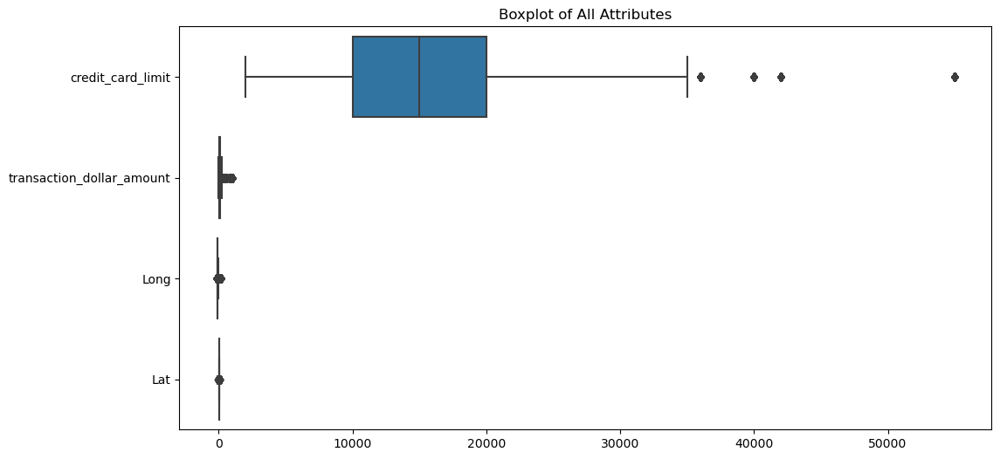

In [192]:
data2=data.drop(columns=['credit_card','zipcode'])
plt.figure(figsize=(12, 6))  # Điều chỉnh kích thước biểu đồ
sns.boxplot(data=data2, orient="h")  # "orient" là "h" để vẽ Boxplot ngang, "v" để vẽ Boxplot đứng
plt.title('Boxplot of All Attributes')
plt.show()

> **Xem xét thuộc tính `credit_card_limit`**

In [193]:

credit_card_limit_mean = data2['credit_card_limit'].mean()
print("credit_card_limit_mean:", credit_card_limit_mean)

credit_card_limit_median = data2['credit_card_limit'].median()
print("credit_card_limit_median:", credit_card_limit_median)

credit_card_limit_mode = data2['credit_card_limit'].mode().values[0]
print("credit_card_limit_mode:", credit_card_limit_mode)

credit_card_limit_mean: 15502.053715697855
credit_card_limit_median: 15000.0
credit_card_limit_mode: 20000


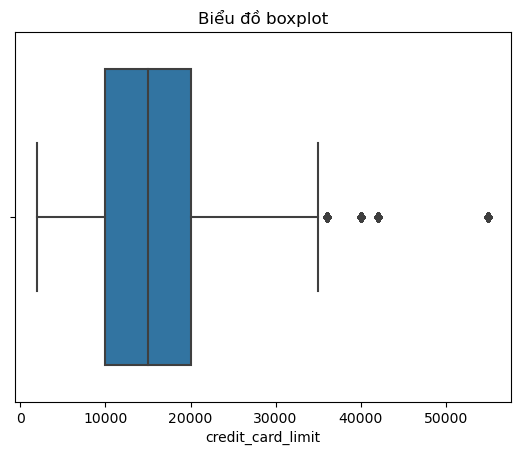

In [194]:
# Vẽ biểu đồ boxplot cho một biến số
sns.boxplot(x='credit_card_limit', data=data)
plt.title('Biểu đồ boxplot')
plt.show()

In [195]:
outliers, upper, lower = detect_outliers_IQR(data2['credit_card_limit'])

print("số lượng outliers: "+ str(len(outliers)))

print("giá trị max outliers: "+ str(outliers.max()))

print("giá trị min outliers: "+ str(outliers.min()))

print("tỉ lệ outliers: "+ str(len(outliers)/len(df) * 100))

số lượng outliers: 5857
giá trị max outliers: 55000
giá trị min outliers: 36000
tỉ lệ outliers: 1.988200469808682


---> Tỉ lệ phần trăm outliers của `credit_card_limit` quá nhỏ nên bỏ qua các ngoại lê này

> **Xem xét thuộc tính `transaction_dollar_amount`**

In [254]:
transaction_dollar_amount_mean = data2['transaction_dollar_amount'].mean()
print("transaction_dollar_amount_mean:", transaction_dollar_amount_mean)

transaction_dollar_amount_median = data2['transaction_dollar_amount'].median()
print("transaction_dollar_amount_median:", transaction_dollar_amount_median)

transaction_dollar_amount_mode = data2['transaction_dollar_amount'].mode().values[0]
print("transaction_dollar_amount_mode:", transaction_dollar_amount_mode)

transaction_dollar_amount_mean: 86.00769298138417
transaction_dollar_amount_median: 58.47
transaction_dollar_amount_mode: 24.15


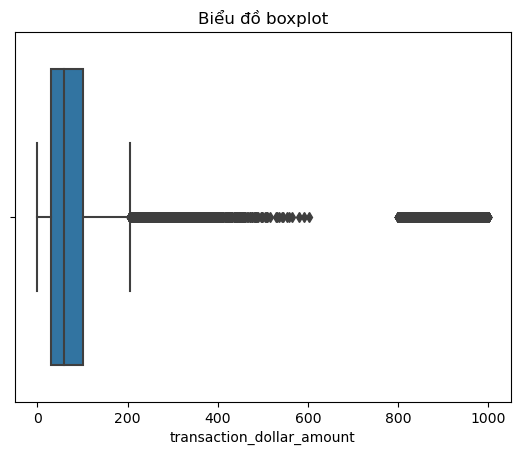

In [257]:
# Vẽ biểu đồ boxplot cho một biến số
sns.boxplot(x='transaction_dollar_amount', data=data2)
plt.title('Biểu đồ boxplot')
plt.show()

In [258]:
outliers, upper, lower = detect_outliers_IQR(data2['transaction_dollar_amount'])

print("số lượng outliers: "+ str(len(outliers)))

print("giá trị max outliers: "+ str(outliers.max()))

print("giá trị min outliers: "+ str(outliers.min()))

print("tỉ lệ outliers: "+ str(len(outliers)/len(df) * 100))

số lượng outliers: 13469
giá trị max outliers: 999.97
giá trị min outliers: 206.05
tỉ lệ outliers: 4.572148220565672


#### ------>Bộ dữ liệu không cần làm sạch

<a id="3.2"></a>
#### ️🎯 3.2 Tạo biến phụ

In [196]:
#dữ liệu của thuộc tính date đang là kiểu chuỗi nên tiến hành chuyển dữ liệu thành dạng datetime
data['date'] = pd.to_datetime(data['date'])

In [197]:
#thực hiện chuyển date thành các ngày, tháng, năm, ... cụ thể
data['date_only'] = data['date'].dt.strftime("%Y/%m/%d")
data['time_only'] = data['date'].dt.strftime("%H:%M:%S")
data['hour'] = data['date'].dt.strftime("%H")
data['day_of_the_week'] = data['date'].dt.strftime('%A')
data['num_day'] = data['date'].dt.strftime('%w')
data['month_only'] = data['date'].dt.strftime('%m')
data['year_only'] = data['date'].dt.strftime('%Y')
data['hour'] = data['hour'].str.replace('00', '24')

Thêm cột state_encoded để thể hiện giá trị số của cột state

In [3]:
import pandas as pd
df = pd.read_csv('data_credit_card_2.csv',index_col=0)

In [6]:

# Tạo một đối tượng LabelEncoder
label_encoder = LabelEncoder()

# Mã hóa cột 'state' thành giá trị số và tạo một cột mới 'state_encoded'
df['state_encoded'] = label_encoder.fit_transform(df['state']) + 1

# Hiển thị dữ liệu sau khi mã hóa
print(df[['state', 'state_encoded']].head())

                 state  state_encoded
credit_card                          
1280981422329509    PA             27
1280981422329509    PA             27
1280981422329509    PA             27
1280981422329509    PA             27
1280981422329509    PA             27


In [7]:
print(df[['state', 'state_encoded']].drop_duplicates().sort_values(by='state_encoded'))


                 state  state_encoded
credit_card                          
5686317975615926    AL              1
7180893798762595    AZ              2
7804216189681274    CA              3
8536914250563809    CO              4
4233789026286017    CT              5
3546693056773873    FL              6
6198761755487915    GA              7
5285935774074579    HI              8
8534199181434464    IA              9
7636362072432217    ID             10
2377857415001409    IL             11
8221913653327075    IN             12
1284450389976622    KS             13
7115509751643442    LA             14
4749889059323202    MA             15
7809589434909452    MD             16
6063334769611138    ME             17
5290774753899753    MI             18
2097167243683055    MO             19
9066991493609928    NC             20
8137811493121777    NH             21
7482288151831611    NJ             22
6465194079012865    NM             23
2095640259001271    NY             24
749928935116

Tạo thuộc tính thể hiện giá trị số nguyên của Long,Lat

In [8]:
# Hàm để cắt giá trị
def cut_long_lat(value):
    # Convert the float object to a string
    num_str = str(value)

    # Split the string using the "." delimiter
    parts = num_str.split(".")

    # Get the first two values before the "."
    result = int(parts[0])
    
    return result 

df['Long_degree'] = df['Long'].apply(cut_long_lat)
df['Lat_degree'] = df['Lat'].apply(cut_long_lat)

In [10]:
df.to_csv('data_credit_card_3.csv')


<a id="3.3"></a>
#### ️🎯 3.3 Xóa biến không cần thiết

In [198]:
#sau khi bóc tách dữ liệu thuộc tính 'date', tiến hành xóa nó ra khỏi bộ dữ liệu
data = data.drop(columns= ["date"], axis = 1)
data.head()


,credit_card,city,state,zipcode,credit_card_limit,transaction_dollar_amount,Long,Lat,date_only,time_only,hour,day_of_the_week,num_day,month_only,year_only
0,1280981422329509,Dallas,PA,18612,6000,11.94,-75.964527,41.353578,2015/08/05,00:59:19,24,Wednesday,3,08,2015
1,1280981422329509,Dallas,PA,18612,6000,5.76,-76.019703,41.311467,2015/10/29,18:23:04,18,Thursday,4,10,2015
2,1280981422329509,Dallas,PA,18612,6000,25.84,-76.043031,41.291053,2015/10/25,17:50:48,17,Sunday,0,10,2015
3,1280981422329509,Dallas,PA,18612,6000,68.89,-75.944299,41.327282,2015/09/05,17:39:43,17,Saturday,6,09,2015
4,1280981422329509,Dallas,PA,18612,6000,27.01,-75.997259,41.352099,2015/09/04,14:12:59,14,Friday,5,09,2015


<a id="3.4"></a>
#### ️🎯 3.4 Lưu tập dữ liệu

In [53]:
df.to_csv('data_credit_card_3.csv', index = False)

<a id="4"></a>
<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 4. Phân tích mối quan hệ</strong></h1>
<hr>

<a id="4.1"></a>
#### ️🎯 4.1 Xét tổng quan mối quan hệ

In [201]:
#thực hiện xóa bỏ các thuộc tính không liên quan để tính toán và vẽ biểu đồ tương quan
correlation_matrix = data.corr()
print(correlation_matrix)

                           credit_card   zipcode  credit_card_limit  \
credit_card                   1.000000  0.023004           0.011901   
zipcode                       0.023004  1.000000           0.011202   
credit_card_limit             0.011901  0.011202           1.000000   
transaction_dollar_amount     0.009549 -0.005317           0.188187   
Long                         -0.014723 -0.499151           0.001861   
Lat                          -0.026233 -0.309885          -0.020188   

                           transaction_dollar_amount      Long       Lat  
credit_card                                 0.009549 -0.014723 -0.026233  
zipcode                                    -0.005317 -0.499151 -0.309885  
credit_card_limit                           0.188187  0.001861 -0.020188  
transaction_dollar_amount                   1.000000  0.005647 -0.003378  
Long                                        0.005647  1.000000 -0.090308  
Lat                                        -0.003378

C:\Users\datho\AppData\Local\Temp\ipykernel_14976\1822715966.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


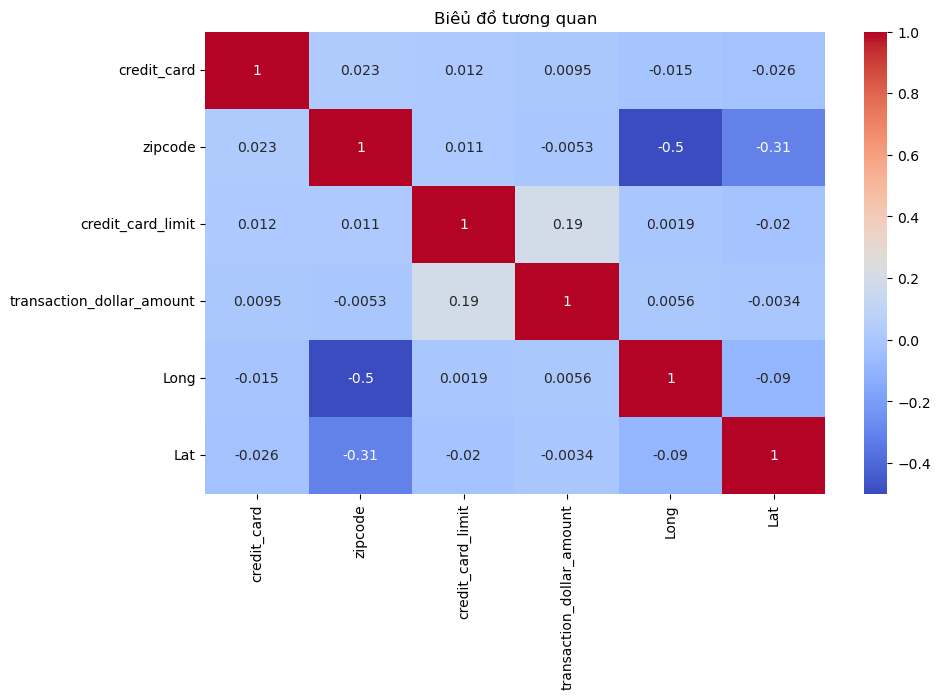

In [202]:
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm')

plt.title('Biêủ đồ tương quan')
plt.show()

**Thực hiện vẽ biểu đồ cho thấy được sự phân tán giữa các biến**

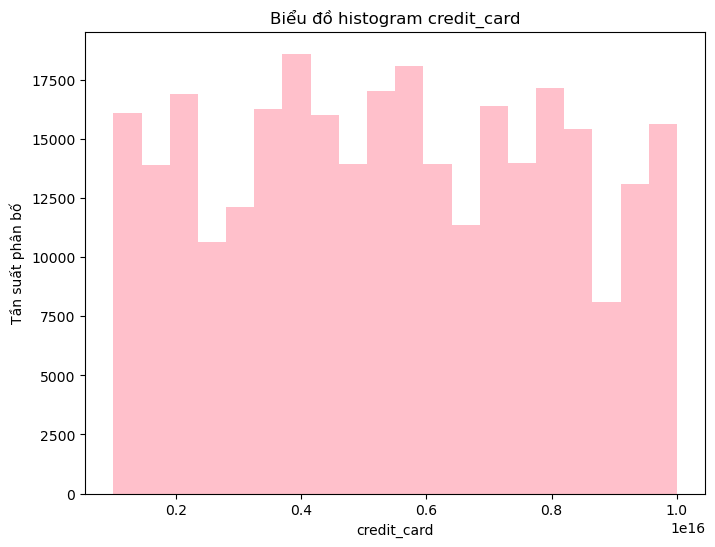

In [203]:
# Vẽ biểu đồ histogram cho credit_card
plt.figure(figsize=(8, 6))
plt.hist(data['credit_card'], bins=20, color ='pink')
plt.xlabel('credit_card')
plt.ylabel('Tần suất phân bố')
plt.title('Biểu đồ histogram credit_card')
plt.show()

<Axes: >

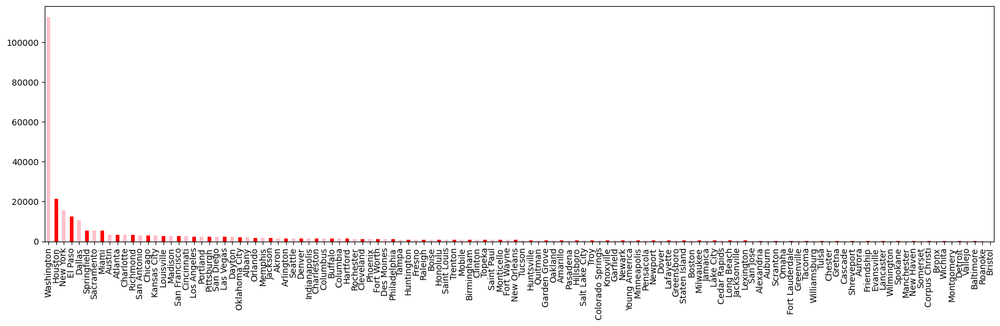

In [204]:
#số lượng giao dịch dựa trên city
data['city'].value_counts().plot(kind='bar', figsize= (20,5),color=['pink', 'red'])


<Axes: >

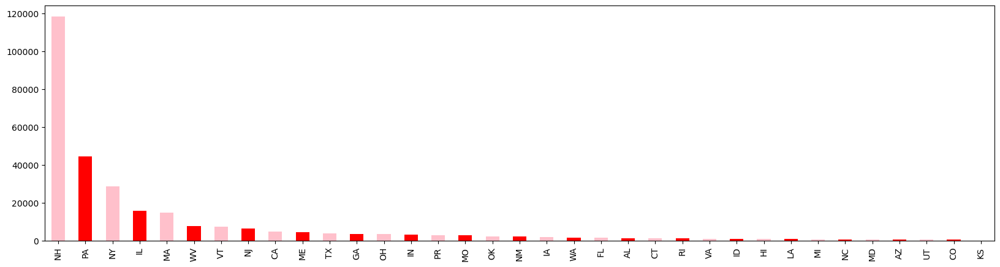

In [205]:
#số lượng giao dịch dựa trên state
data['state'].value_counts().plot(kind='bar', figsize= (20,5),color=['pink', 'red'])



**Ở 2 biểu đồ trên, ta có thể thấy, lượng giao dịch tập trung khá nhiều ở thành phố "Washington" và đặc biệt là ở tiểu bang "NH". Ở Thành Phố "Washington" và Tiểu Bang "NH" có giá trị và số lượng giao dịch rất cao so với các Thành Phố và Tiểu Bang khác.**

<Axes: >

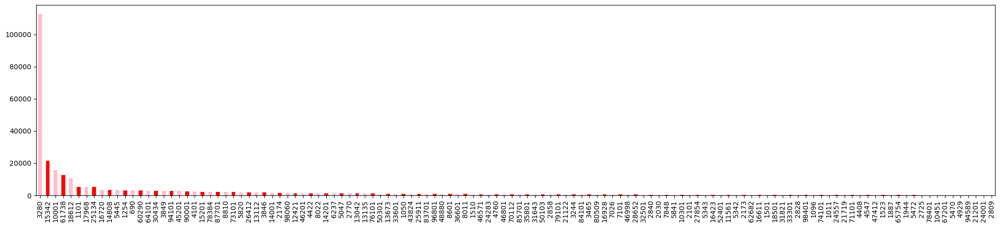

In [206]:
#số lượng giao dịch dựa trên zipcode
data['zipcode'].value_counts().plot(kind='bar', figsize= (25,5),color=['pink', 'red'])


<Axes: >

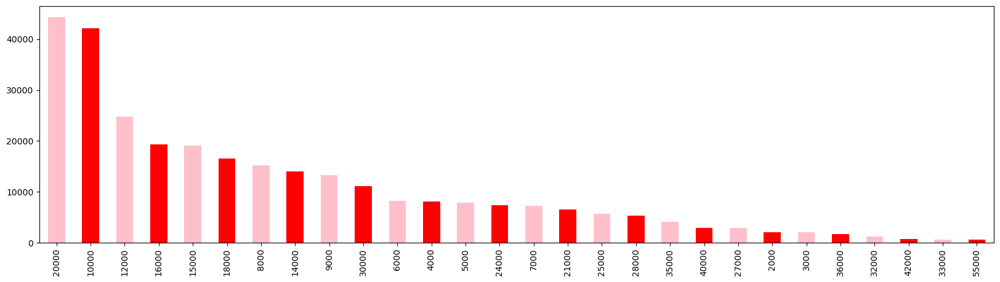

In [207]:
#số lượng giao dịch dựa trên zipcode
data['credit_card_limit'].value_counts().plot(kind='bar', figsize= (20,5),color=['pink', 'red'])

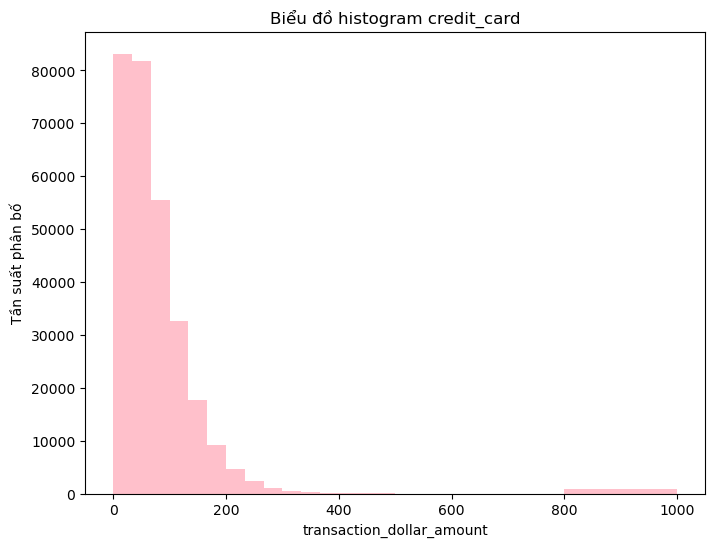

In [208]:
#số lượng giao dịch dựa trên transaction_dollar_amount
plt.figure(figsize=(8, 6))
plt.hist(data['transaction_dollar_amount'], bins=30, color ='pink')
plt.xlabel('transaction_dollar_amount')
plt.ylabel('Tần suất phân bố')
plt.title('Biểu đồ histogram credit_card')
plt.show()

<a id="4.2"></a>
#### ️🎯 4.2 Mối quan hệ giữa thành phố và mức giới hạn thẻ tín dụng

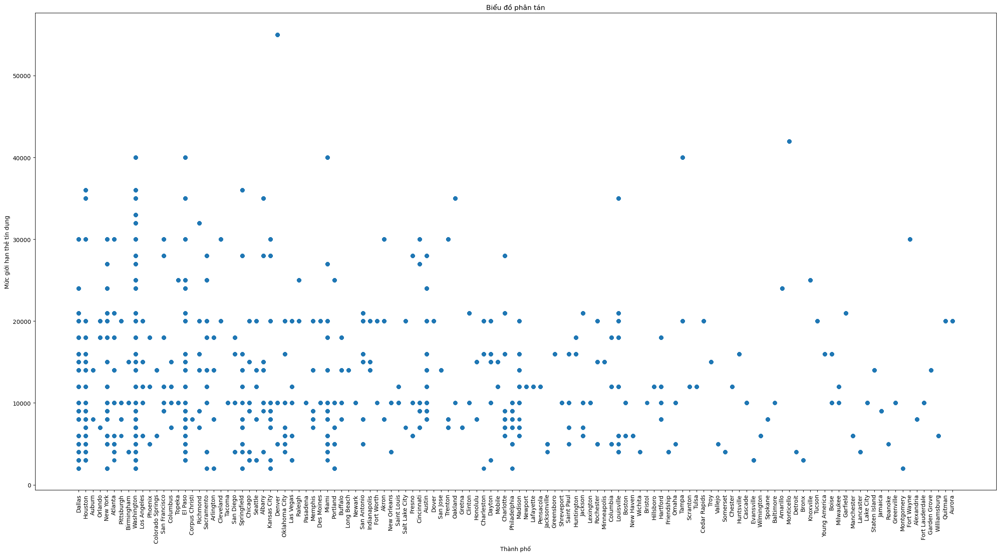

In [217]:
# Vẽ biểu đồ phân tán giữa "city" và "credit_card_limit"
plt.figure(figsize=(30, 15))
plt.scatter(data['city'], data['credit_card_limit'])
plt.xlabel('Thành phố')
plt.ylabel('Mức giới hạn thẻ tín dụng')
plt.xticks(rotation=90)  # Xoay tên trục x 90 độ
plt.title('Biểu đồ phân tán')
plt.show()


Theo kết luận ở trên, thành phố washington là nơi có số lượng người giao dịch thẻ tín dụng nhiều nhất nhưng dựa trên biểu đồ về giới hạn của thẻ tín dụng thì thành phố này lại thuộc nhóm được cấp hạn mức thấp nhất. Vậy thì có những lí do gì ?
 - Điều kiện kinh tế của thành phố
 - Tỉ lệ tội phạm và các hành vi gian lận cao
 - Tình hình kinh tế.

<a id="4.3"></a>
#### ️🎯 4.3 Mối quan hệ giữa credit_card_limit và transaction_amount

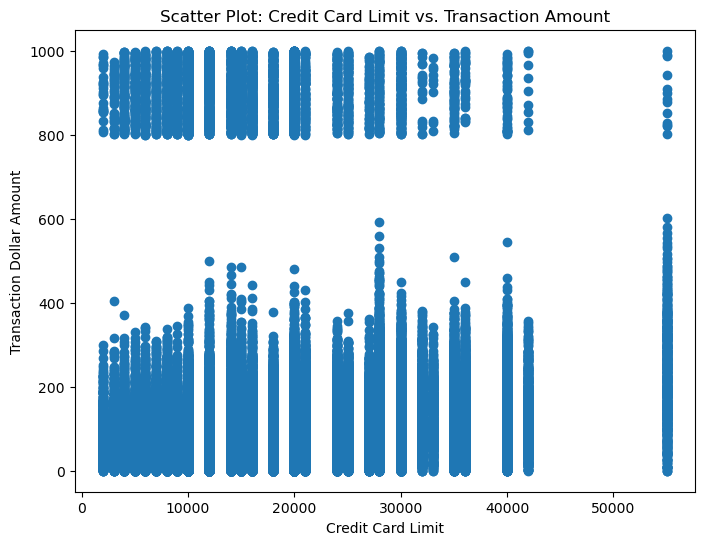

Correlation between Credit Card Limit and Transaction Amount: 0.18818736241196812


In [218]:

# Biểu đồ phân tán
plt.figure(figsize=(8, 6))
plt.scatter(data['credit_card_limit'], data['transaction_dollar_amount'])
plt.xlabel('Credit Card Limit')
plt.ylabel('Transaction Dollar Amount')
plt.title('Scatter Plot: Credit Card Limit vs. Transaction Amount')
plt.show()

# Tính hệ số tương quan
correlation = data['credit_card_limit'].corr(data['transaction_dollar_amount'])
print(f'Correlation between Credit Card Limit and Transaction Amount: {correlation}')


 **Dựa vào biểu đồ trên, ta thấy: Nếu thẻ tín dụng có hạn mức cao hơn thì tương đương với số tiền sử dụng cũng nhiều hơn**

<a id="4.4"></a>
#### ️🎯 4.4 Mối quan hệ giữa số lượng thẻ tín dụng được sử dụng và số lượng giao dịch

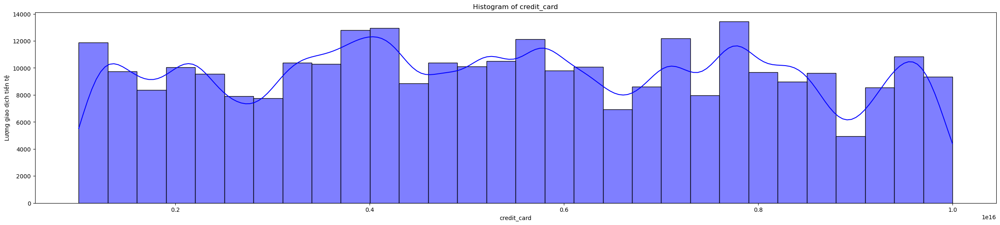

In [219]:
plt.figure(figsize=(30, 6))
sns.histplot(data, x='credit_card', kde=True, bins=30, color='blue')
plt.title('Histogram of credit_card')
plt.xlabel('credit_card')
plt.ylabel('Lượng giao dịch tiền tệ')
plt.show()

<a id="4.5"></a>
#### ️🎯 4.5 Mối quan hệ giữa chủ thẻ và số lần giao dịch trong ngày (ngưỡng trung bình). Nếu vượt quá ngưỡng thì có giao dịch gian lận không?

> Xem xét các giao dịch có số lượng giao dịch lớn hơn ngưỡng nhất định

Để xác định được ngưỡng số lượng giao dịch trong 1 ngày sẽ dựa vào 2 thuộc tính 'date_only' và 'credit_card'

> Xác định những thẻ có giao dịch lớn hơn trung bình

In [222]:
transaction_counts = data.groupby(['credit_card', 'date_only']).size().reset_index(name='transaction_count')
# Lọc ra các giao dịch có 'transaction_count' lớn hơn trung binh
suspicious_transactions = transaction_counts[transaction_counts['transaction_count'] > average_transaction_count]
# Kết hợp lại với tập dữ liệu gốc để xem chi tiết các giao dịch
result = pd.merge(data, suspicious_transactions, on=['credit_card', 'date_only'], how='inner')


In [223]:
result.head()

,credit_card,city,state,zipcode,credit_card_limit,transaction_dollar_amount,Long,Lat,date_only,time_only,hour,day_of_the_week,num_day,month_only,year_only,transaction_count
0,1280981422329509,Dallas,PA,18612,6000,11.94,-75.964527,41.353578,2015/08/05,00:59:19,24,Wednesday,3,08,2015,5
1,1280981422329509,Dallas,PA,18612,6000,32.99,-75.903602,41.326249,2015/08/05,19:04:11,19,Wednesday,3,08,2015,5
2,1280981422329509,Dallas,PA,18612,6000,27.65,-75.938143,41.290520,2015/08/05,22:57:20,22,Wednesday,3,08,2015,5
3,1280981422329509,Dallas,PA,18612,6000,43.42,-76.016675,41.315107,2015/08/05,19:33:55,19,Wednesday,3,08,2015,5
4,1280981422329509,Dallas,PA,18612,6000,34.62,-75.944808,41.333820,2015/08/05,23:13:38,23,Wednesday,3,08,2015,5


In [224]:
print("Số lượng thẻ giao dịch trên ngưỡng trung bình là : " + str(result['credit_card'].nunique()))

Số lượng thẻ giao dịch trên ngưỡng trung bình là : 826


In [230]:
average_transaction_count = result['transaction_count'].mean()
average_transaction_count = round(average_transaction_count)
print("Trung bình số lượng giao dịch trên một ngày của một chủ thẻ là :", average_transaction_count)

Trung bình số lượng giao dịch trên một ngày của một chủ thẻ là : 8


<a id="4.5"></a>
#### ️🎯 4.6 Mối quan hệ giữa số tiền giao dịch (transactions_dollar amount) và các Bang (state)

**Những bang có tổng số tiền giao dịch cao và thấp có ảnh hưởng đến việc phát hiện gian lận hay không?**
> Cần chia cụm thành 2 cụm (Cao- Thấp) hoặc k cụm

In [9]:
import pandas as pd
import plotly.express as px
from sklearn.cluster import KMeans


# Đọc dữ liệu từ file CSV
df = pd.read_csv('data_credit_card_2.csv')  # Thay 'ten_file.csv' bằng đường dẫn thực tế của bạn

# Tính tổng lượng tiền giao dịch của mỗi 'state'
total_transaction_by_state = df.groupby('state')['transaction_dollar_amount'].sum().reset_index()

# Thực hiện gom cụm
X = total_transaction_by_state[['transaction_dollar_amount']]
kmeans = KMeans(n_clusters=2, random_state=42)
total_transaction_by_state['cluster'] = kmeans.fit_predict(X)

# Biểu đồ scatter plot
fig = px.scatter(total_transaction_by_state,
                 x='state',
                 y='transaction_dollar_amount',
                 color='cluster',
                 title='Clusters of States based on Transaction Amount',
                 labels={'transaction_dollar_amount': 'Total Transaction Amount'},
                 hover_data=['transaction_dollar_amount'])

# Hiển thị biểu đồ
fig.show()

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



**Lượng tiền giao dịch của các State**


In [10]:
# Đọc dữ liệu từ file CSV
df = pd.read_csv('data_credit_card_2.csv',index_col=0)  # Thay 'ten_file.csv' bằng đường dẫn thực tế của bạn

# Tính tổng lượng tiền giao dịch của mỗi 'state'
total_transaction_by_state = df.groupby('state')['transaction_dollar_amount'].sum().reset_index()

# Biểu đồ choropleth
fig = px.choropleth(total_transaction_by_state,
                    locations='state',
                    locationmode='USA-states', 
                    color='transaction_dollar_amount',
                    color_continuous_scale='Viridis',
                    scope='usa',
                    title='Total Transaction Amount by State',
                    labels={'transaction_dollar_amount': 'Total Transaction Amount'},
                    
                    )  # Thêm 'hover_data' để hiển thị thông tin khi di chuột qua

# Hiển thị biểu đồ
fig.show()


Quan sát:
1. nếu chia 2 cụm thì state NH có tổng số tiền giao dịch có khoảng cách quá xa so với các state còn lại
2. Số lượng state tập trung về cluster 0

Thực hiện tìm k để có số cụm tốt

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

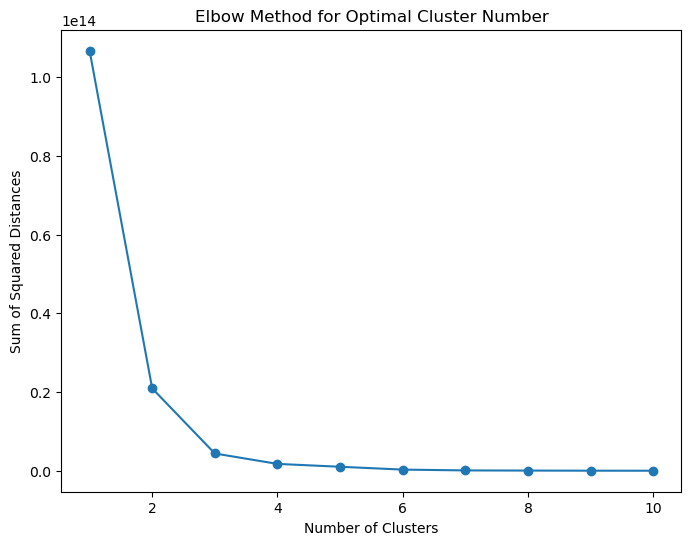

In [11]:
import matplotlib.pyplot as plt

# Thử nghiệm với số lượng cụm từ 1 đến 10
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(total_transaction_by_state[['transaction_dollar_amount']])
    sse.append(kmeans.inertia_)

# Vẽ biểu đồ Elbow
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.title('Elbow Method for Optimal Cluster Number')
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.show()

Quan sát từ k=4 trở đi, đường cong không còn giảm nữa \
--> Nên chọn k=4 làm số lượng cụm tối ưu

In [15]:

X = total_transaction_by_state[['transaction_dollar_amount']]
kmeans = KMeans(n_clusters=4, random_state=42)
total_transaction_by_state['transaction_cluster'] = kmeans.fit_predict(X)

# Biểu đồ scatter plot
fig = px.scatter(total_transaction_by_state,
                 x='state',
                 y='transaction_dollar_amount',
                 color='transaction_cluster',
                 title='Clusters of States based on Transaction Amount',
                 labels={'transaction_dollar_amount': 'Total Transaction Amount'},
                 hover_data=['transaction_dollar_amount'])

# Hiển thị biểu đồ
fig.show()

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



In [34]:
# Lọc và in ra các tiểu bang thuộc từng cụm
for cluster_num in range(4):
    states_in_cluster = total_transaction_by_state[total_transaction_by_state['transaction_cluster'] == cluster_num]['state'].tolist()
    print(f'Cluster {cluster_num}: {states_in_cluster}')

Cluster 0: ['AL', 'AZ', 'CA', 'CO', 'CT', 'FL', 'GA', 'HI', 'IA', 'ID', 'IN', 'KS', 'LA', 'MD', 'ME', 'MI', 'MO', 'NC', 'NJ', 'NM', 'OH', 'OK', 'PR', 'RI', 'TX', 'UT', 'VA', 'WA']
Cluster 1: ['NH']
Cluster 2: ['NY', 'PA']
Cluster 3: ['IL', 'MA', 'VT', 'WV']


In [35]:
# Thêm cột 'cluster' vào DataFrame gốc
df = pd.merge(df, total_transaction_by_state[['state', 'transaction_cluster']], on='state', how='left')
df.head()


,credit_card,city,state,zipcode,credit_card_limit,transaction_dollar_amount,Long,Lat,date_only,time_only,hour,day_of_the_week,num_day,month_only,year_only,transaction_cluster
0,1280981422329509,Dallas,PA,18612,6000,11.94,-75.964527,41.353578,2015/08/05,00:59:19,24,Wednesday,3,8,2015,2
1,1280981422329509,Dallas,PA,18612,6000,5.76,-76.019703,41.311467,2015/10/29,18:23:04,18,Thursday,4,10,2015,2
2,1280981422329509,Dallas,PA,18612,6000,25.84,-76.043031,41.291053,2015/10/25,17:50:48,17,Sunday,0,10,2015,2
3,1280981422329509,Dallas,PA,18612,6000,68.89,-75.944299,41.327282,2015/09/05,17:39:43,17,Saturday,6,9,2015,2
4,1280981422329509,Dallas,PA,18612,6000,27.01,-75.997259,41.352099,2015/09/04,14:12:59,14,Friday,5,9,2015,2


In [38]:
df.to_csv('data_credit_card_3.csv', index = False)

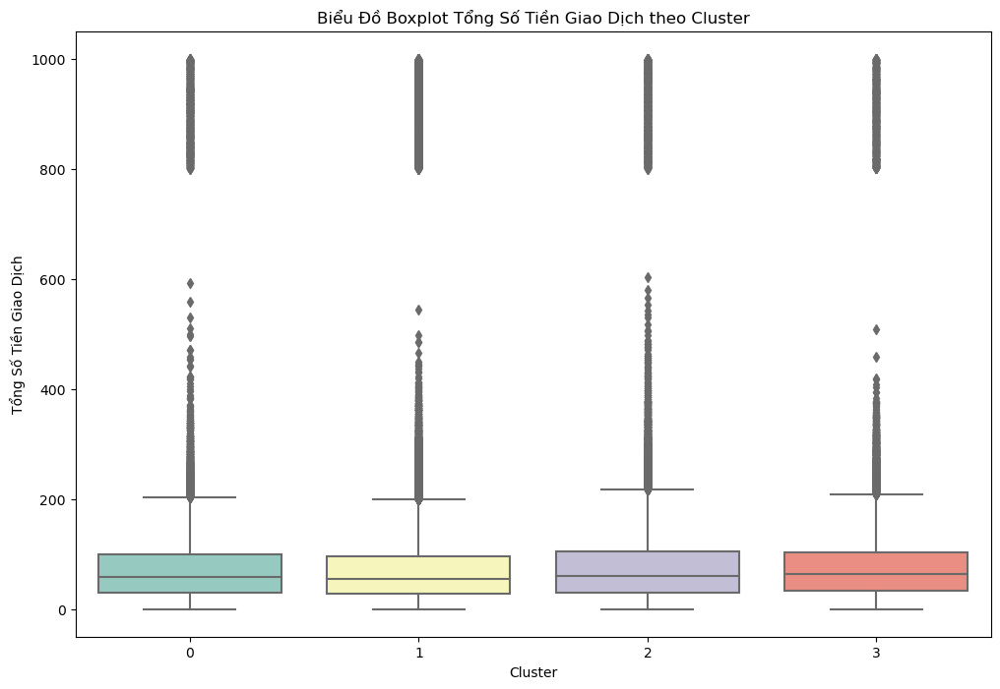

In [36]:
# Biểu đồ Boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(x='transaction_cluster', y='transaction_dollar_amount', data=df, palette='Set3')
plt.title('Biểu Đồ Boxplot Tổng Số Tiền Giao Dịch theo Cluster')
plt.xlabel('Cluster')
plt.ylabel('Tổng Số Tiền Giao Dịch')
plt.show()

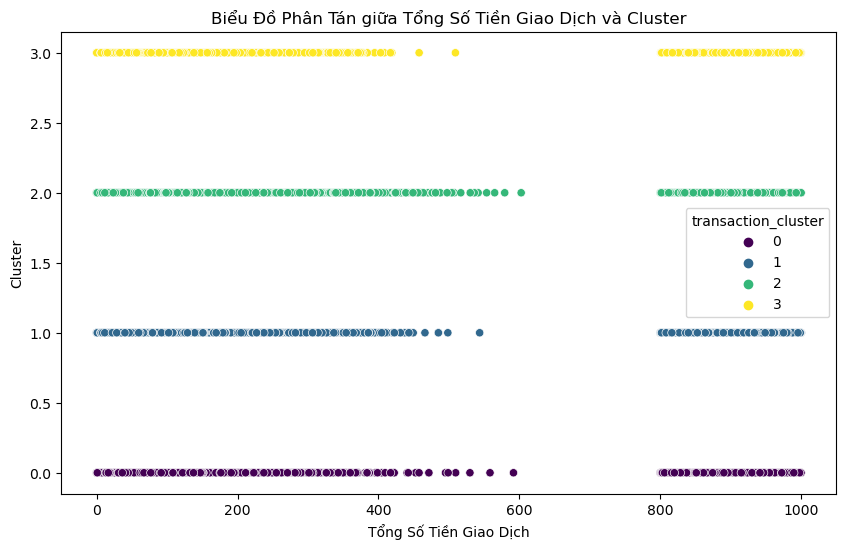

In [37]:
# Sử dụng biểu đồ phân tán
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='transaction_dollar_amount', y='transaction_cluster', hue='transaction_cluster', palette='viridis')
plt.title('Biểu Đồ Phân Tán giữa Tổng Số Tiền Giao Dịch và Cluster')
plt.xlabel('Tổng Số Tiền Giao Dịch')
plt.ylabel('Cluster')
plt.show()

**Biểu đồ phân phối cụm các tiểu bang**

In [49]:
# Tính tổng lượng tiền giao dịch của mỗi 'state'
total_transaction_by_state = df.groupby(['state', 'transaction_cluster'])['transaction_dollar_amount'].sum().reset_index()

# Biểu đồ choropleth
fig = px.choropleth(total_transaction_by_state,
                    locations='state',
                    locationmode='USA-states', 
                    color='transaction_cluster',  # Màu dựa trên giá trị của cột 'transaction_cluster'
                    color_continuous_scale='Viridis',  # Cấu hình màu sắc
                    scope='usa',
                    title='Transaction Clusters by State',
                    labels={'transaction_cluster': 'Transaction Cluster'},
                    )

# Hiển thị biểu đồ
fig.show()

<a id="4.6"></a>
#### ️🎯 4.6 Mối quan hệ giữa tổng số tiền giao dịch và Mức giới hạn thẻ tín dụng trong 1 tháng

- Những thẻ có tổng tiền giao dịch lớn hơn mức giới hạn có gian lận thẻ tính dụng

In [17]:
# Nhóm theo 'credit_card' (ID của chủ thẻ) và 'date_only' (ngày) và tính tổng số tiền giao dịch cho mỗi người chủ thẻ trong một ngày
daily_total_transaction_amount = df.groupby(['credit_card', 'month_only','credit_card_limit'])['transaction_dollar_amount'].sum().reset_index()
# In ra kết quả
daily_total_transaction_amount


,credit_card,month_only,credit_card_limit,transaction_dollar_amount
0,1003715054175576,7,20000,162.56
1,1003715054175576,8,20000,8441.51
2,1003715054175576,9,20000,11281.56
3,1003715054175576,10,20000,8954.21
4,1013870087888817,7,15000,281.43
...,...,...,...,...
3792,9986135779184360,10,14000,11796.95
3793,9999757432802760,7,6000,77.59
3794,9999757432802760,8,6000,4408.83
3795,9999757432802760,9,6000,6814.72


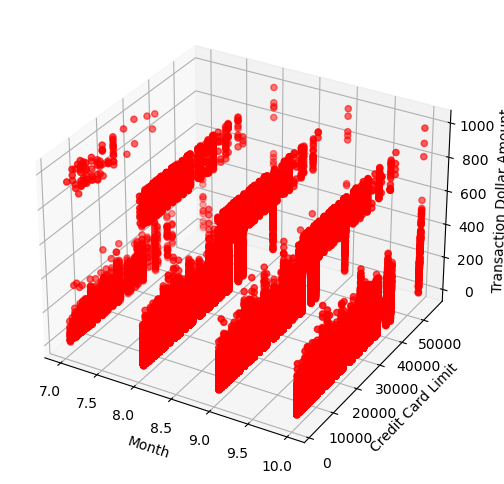

In [21]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd

# Tạo biểu đồ Scatter 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Dữ liệu
x = df['month_only']
y = df['credit_card_limit']
z = df['transaction_dollar_amount']

# Vẽ Scatter 3D
ax.scatter(x, y, z, c='r', marker='o')

# Đặt tên cho trục
ax.set_xlabel('Month')
ax.set_ylabel('Credit Card Limit')
ax.set_zlabel('Transaction Dollar Amount')

# Hiển thị biểu đồ
plt.show()

> Những chủ thẻ có giao dịch vượt quá hạn mức trong một tháng

In [18]:
list_dangerous = daily_total_transaction_amount[daily_total_transaction_amount['credit_card_limit'] < daily_total_transaction_amount['transaction_dollar_amount']]
list_dangerous

,credit_card,month_only,credit_card_limit,transaction_dollar_amount
32,1106824181265726,8,6000,6734.92
33,1106824181265726,9,6000,7419.42
34,1106824181265726,10,6000,7483.05
80,1175962294549313,8,14000,15809.71
81,1175962294549313,9,14000,14370.20
...,...,...,...,...
3696,9727202337611852,8,20000,20207.03
3698,9727202337611852,10,20000,20077.76
3700,9737219864179988,8,16000,16156.60
3795,9999757432802760,9,6000,6814.72


<a id="4.6"></a>
#### ️🎯 4.6 Mối quan hệ giữa 'Long', 'Lat' với transaction_dollar_amount
Liệu có phát hiện được gian lận thẻ tín dụng dựa trên phát hiện các vị trí giao dịch bất thường, địa điểm không phù hợp và không có giao dịch thường xuyên

In [22]:
import pandas as pd
df = pd.read_csv('data_credit_card_3.csv', index_col=0)

c:\Users\datho\anaconda3\envs\study\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



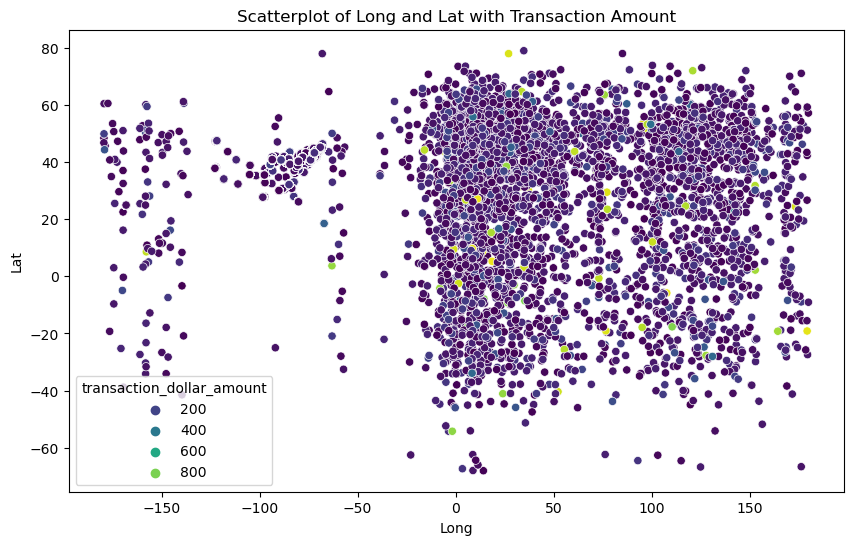

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt
# Biểu đồ scatterplot giữa Long và Lat
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Long', y='Lat', data=df, hue='transaction_dollar_amount', palette='viridis')
plt.title('Scatterplot of Long and Lat with Transaction Amount')
plt.show()

> Những giao dịch có tổng số tiền nhỏ hơn 200 tại một vị trí Long,Lat

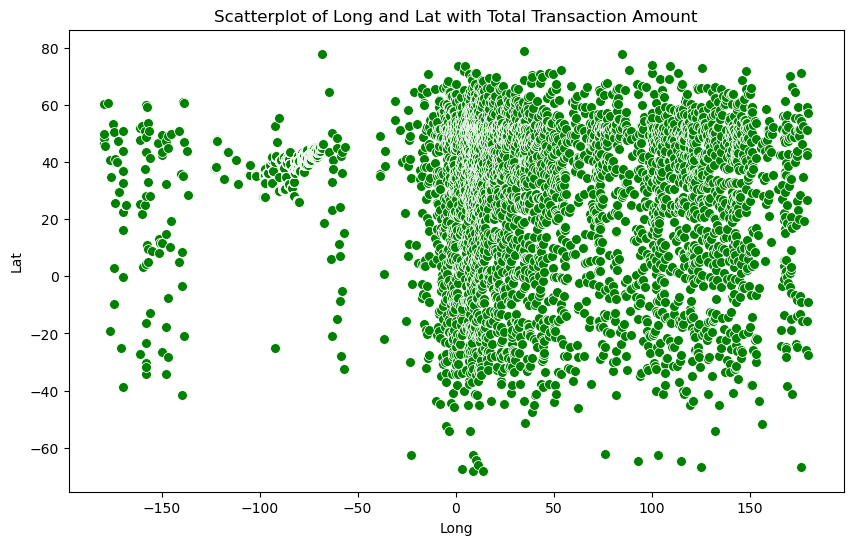

In [30]:

# Tính tổng số tiền giao dịch cho mỗi vị trí
total_transaction_by_location = df.groupby(['Long', 'Lat'])['transaction_dollar_amount'].sum().reset_index()

# Lọc dữ liệu cho các vị trí có tổng số tiền giao dịch là 800
df_filtered = total_transaction_by_location[total_transaction_by_location['transaction_dollar_amount'] <= 200]

# Biểu đồ scatterplot giữa Long và Lat chỉ với tổng số tiền giao dịch là 800
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Long', y='Lat', data=df_filtered, color='green', s=50)
plt.title('Scatterplot of Long and Lat with Total Transaction Amount')
plt.show()

Nhận xét: Các vị trí có tổng số tiền giao dịch nhỏ hơn 200 sẽ tập trung ở Lat từ 30 đến 70 và Long từ -10 đến 60

> Những vị trí có tổng số tiền giao dịch lớn hơn 200 và nhỏ hơn 400

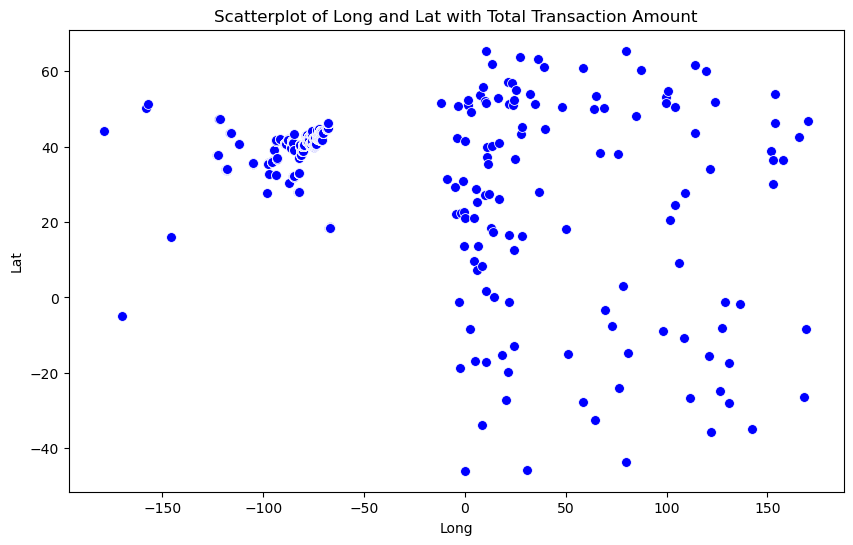

In [33]:

# Tính tổng số tiền giao dịch cho mỗi vị trí
total_transaction_by_location = df.groupby(['Long', 'Lat'])['transaction_dollar_amount'].sum().reset_index()

# Lọc dữ liệu cho các vị trí có tổng số tiền giao dịch
df_filtered = total_transaction_by_location[(total_transaction_by_location['transaction_dollar_amount'] > 200) & (total_transaction_by_location['transaction_dollar_amount'] <= 400)]

# Biểu đồ scatterplot giữa Long và Lat chỉ với tổng số tiền giao dịch là 
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Long', y='Lat', data=df_filtered, color='blue', s=50)
plt.title('Scatterplot of Long and Lat with Total Transaction Amount')
plt.show()

Nhận xét: Các vị trí có tổng số tiền giao dịch lớn hơn 200 và nhỏ hơn 400 sẽ tập trung ở Lat từ 30 đến 50 và Long từ -110 đến -60. Phân bố rải rác Long 0 đến 160

> Những vị trí có tổng số tiền giao dịch lớn hơn 400 và nhỏ hơn 800

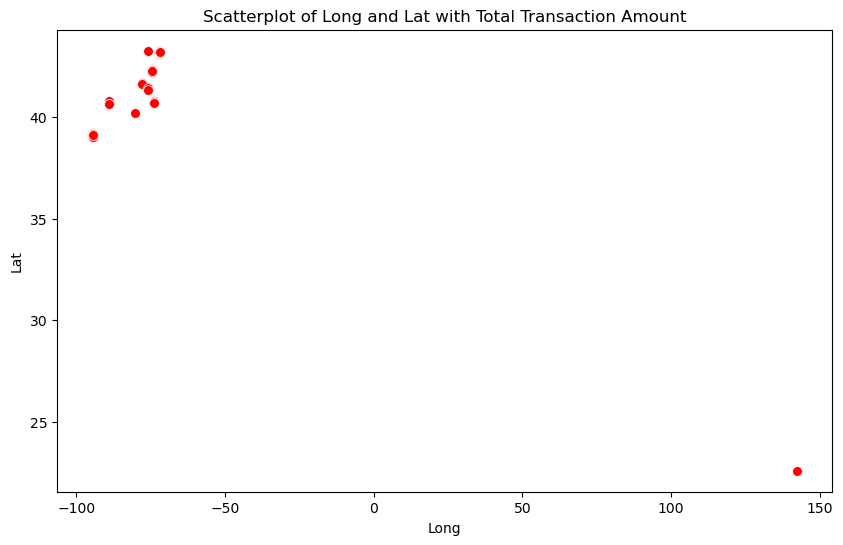

In [35]:
# Tính tổng số tiền giao dịch cho mỗi vị trí
total_transaction_by_location = df.groupby(['Long', 'Lat'])['transaction_dollar_amount'].sum().reset_index()

# Lọc dữ liệu cho các vị trí có tổng số tiền giao dịch là 800
df_filtered = total_transaction_by_location[(total_transaction_by_location['transaction_dollar_amount'] > 400) & (total_transaction_by_location['transaction_dollar_amount'] <= 800)]

# Biểu đồ scatterplot giữa Long và Lat chỉ với tổng số tiền giao dịch
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Long', y='Lat', data=df_filtered, color='red', s=50)
plt.title('Scatterplot of Long and Lat with Total Transaction Amount')
plt.show()

Nhận xét: Các vị trí có tổng số tiền giao dịch lớn hơn 400 và nhỏ hơn 800 có số lượng không nhiều, tập trung ở Lat từ 40 đến 45 và Long từ -90 đến -60. Và có một giao dịch nằm ở Lat 23 Long 140

> Những vị trí có tổng số tiền giao dịch lớn hơn 800

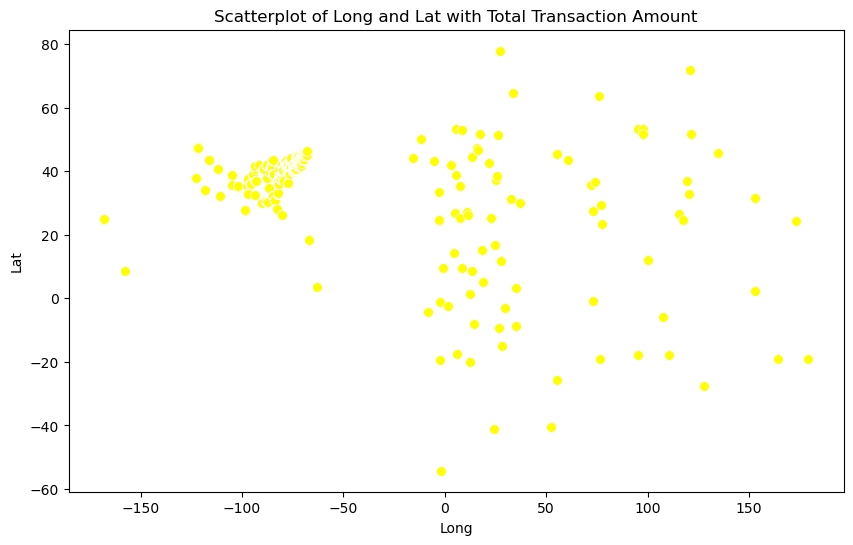

In [37]:
# Tính tổng số tiền giao dịch cho mỗi vị trí
total_transaction_by_location = df.groupby(['Long', 'Lat'])['transaction_dollar_amount'].sum().reset_index()

# Lọc dữ liệu cho các vị trí có tổng số tiền giao dịch là 800
df_filtered = total_transaction_by_location[(total_transaction_by_location['transaction_dollar_amount'] > 800)]

# Biểu đồ scatterplot giữa Long và Lat chỉ với tổng số tiền giao dịch
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Long', y='Lat', data=df_filtered, color='yellow', s=50)
plt.title('Scatterplot of Long and Lat with Total Transaction Amount')
plt.show()

Nhận xét: Các vị trí có tổng số tiền giao dịch lớn hơn 800, tập trung ở Lat từ 20 đến 50 và Long từ -100 đến -60. Và phân bố rải rác từ Long 0 đến 150

<a id="4.7"></a>
#### ️🎯 4.7 Kiểm định giả thuyết liên quan đến các mối quan hệ

4.7.1 Kiểm định giả thuyết mối quan hệ giữa Credit Card Limit và Transaction Amount \
**pearsonr**

In [236]:

# Thực hiện kiểm định tương quan
correlation, p_value = pearsonr(data['credit_card_limit'], data['transaction_dollar_amount'])

# In kết quả
print(f'Correlation between Credit Card Limit and Transaction Amount: {correlation}')
print(f'p-value: {p_value}')
alpha = 0.05  # Mức ý nghĩa
if p_value < alpha:
    print("Có mối quan hệ tuyến tính đáng kể giữa hai biến.")
else:
    print("Không có mối quan hệ tuyến tính đáng kể giữa hai biến.")

Correlation between Credit Card Limit and Transaction Amount: 0.1881873624119681
p-value: 0.0
Có mối quan hệ tuyến tính đáng kể giữa hai biến.


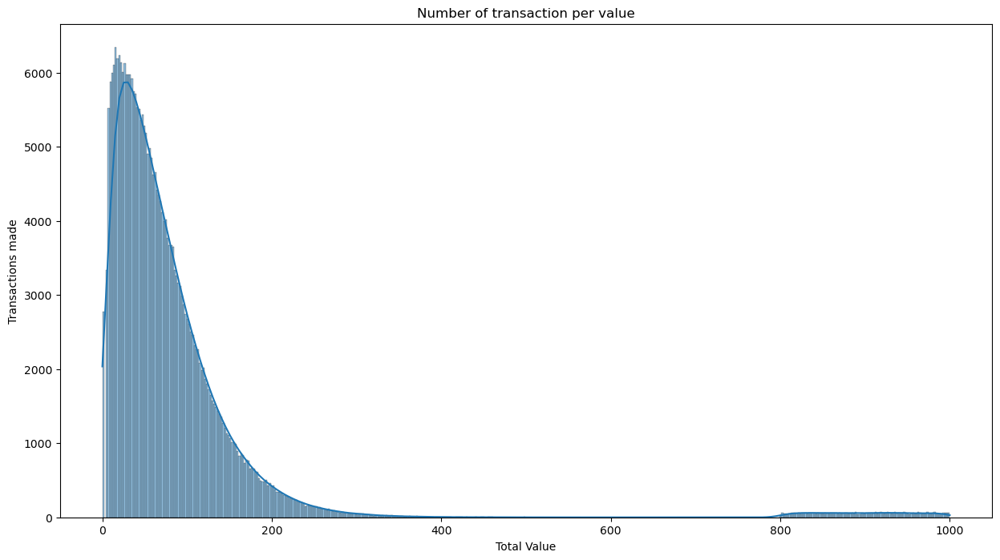

In [237]:
plt.figure(figsize=(15,8))

sns.histplot(data['transaction_dollar_amount'], kde=True)
plt.title('Number of transaction per value')
plt.ylabel('Transactions made')
plt.xlabel('Total Value')

plt.show()

4.7.2 Kiểm định giả thuyết về mối quan hệ giữa thành phố và mức giới hạn thẻ tín dụng

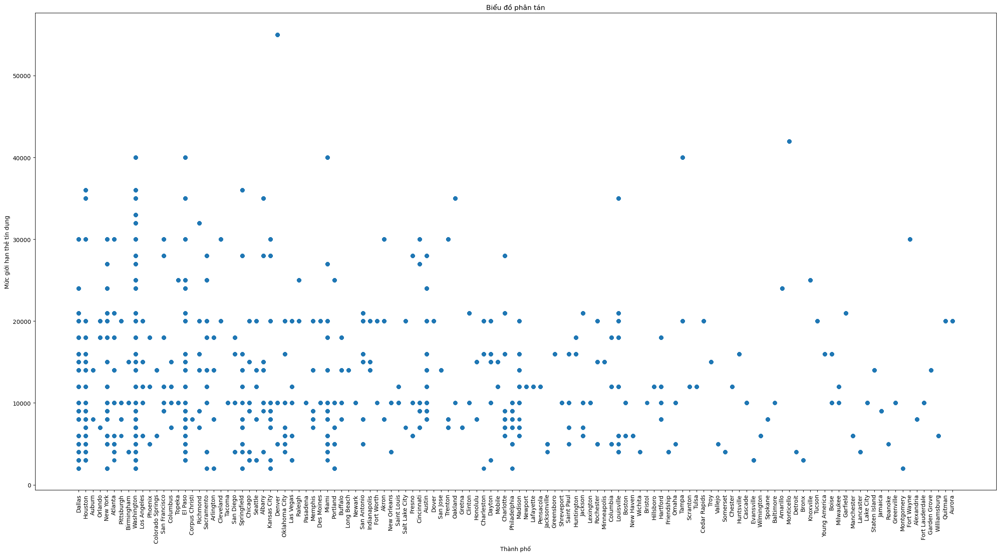

In [20]:
# Vẽ biểu đồ phân tán giữa "city" và "credit_card_limit"
plt.figure(figsize=(30, 15))
plt.scatter(df['city'], df['credit_card_limit'])
plt.xlabel('Thành phố')
plt.ylabel('Mức giới hạn thẻ tín dụng')
plt.xticks(rotation=90)  # Xoay tên trục x 90 độ
plt.title('Biểu đồ phân tán')
plt.show()

Theo kết luận ở trên, thành phố washington là nơi có số lượng người giao dịch thẻ tín dụng nhiều nhất nhưng dựa trên biểu đồ về giới hạn của thẻ tín dụng thì thành phố này lại thuộc nhóm được cấp hạn mức thấp nhất. Vậy thì có những lí do gì ?
 - Điều kiện kinh tế của thành phố
 - Tỉ lệ tội phạm và các hành vi gian lận cao
 - Tình hình kinh tế.

4.7.3 Kiểm định giả thuyết vùng có tổng số tiền giao dịch và số tiền giao dịch transaction_cluster và transaction_dollar_amount \
(Chi square)

In [16]:
from scipy.stats import chi2_contingency
# 
# Tạo bảng tần số
contingency_table = pd.crosstab(df['transaction_cluster'], pd.qcut(df['transaction_dollar_amount'], q=4))

# Kiểm định chi bình phương
chi2, p, _, _ = chi2_contingency(contingency_table)
print(f'Chi-square value: {chi2}')
print(f'p-value: {p}')

Chi-square value: 864.6430967887275
p-value: 2.560583934178488e-180


Với mức giá trị ý nghĩa là 0.05
* H0: Không có quan hệ giữa 'transaction_cluster' và 'transaction_dollar_amount'
* HA: Có quan hệ giữa 'transaction_cluster' và 'transaction_dollar_amount'
  
Từ giá trị p-value có thể bác bỏ giả thuyết vô hiệu (H0) với giá trị là 2.560583934178488e-180 < 0.05 \
=> Có quan hệ giữa 'transaction_cluster' và 'transaction_dollar_amount'

4.7.3 Kiểm định giả thuyết phát hiện vị trí bất thường từ các địa điểm không phù hợp hoặc không thường xuyên, có thể đó là dấu hiệu của hoạt động gian lận dựa trên Long,Lat\
(Pearson)

Xem xét mỗi cặp biến theo cặp \
Kiểm tra mối quan hệ giữa 'Long', 'Lat', và 'Transaction_dollar_amount',

<Axes: >

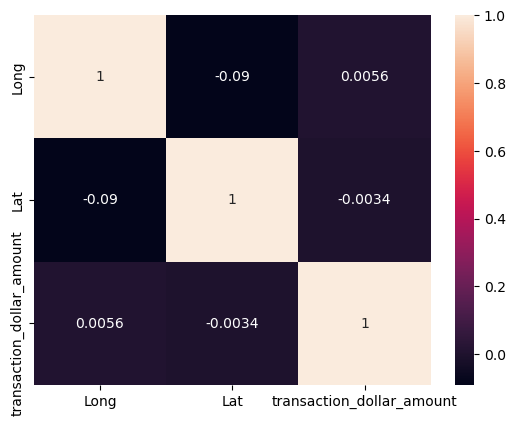

In [40]:

# Tính ma trận hệ số tương quan
correlation_matrix = df[['Long', 'Lat', 'transaction_dollar_amount']].corr()

# In ma trận hệ số tương quan
sns.heatmap(correlation_matrix, annot=True)



In [42]:
# Tính kiểm định Pearson giữa 'Long', 'Lat', và 'Transaction_dollar_amount'
from scipy.stats import pearsonr

# Kiểm định Pearson giữa 'Long' và 'Lat'
corr_long_lat, p_value = pearsonr(df['Long'], df['Lat'])
print(f'Correlation between Long and Lat: {corr_long_lat}')
print(f"P-value: {p_value}")

# Kiểm định Pearson giữa 'Long' và 'Transaction_dollar_amount'
corr_long_amount, p_value = pearsonr(df['Long'], df['transaction_dollar_amount'])
print(f'Correlation between Long and Transaction_dollar_amount: {corr_long_amount}')
print(f"P-value: {p_value}")

# Kiểm định Pearson giữa 'Lat' và 'Transaction_dollar_amount'
corr_lat_amount, p_value = pearsonr(df['Lat'], df['transaction_dollar_amount'])
print(f'Correlation between Lat and Transaction_dollar_amount: {corr_lat_amount}')
print(f"P-value: {p_value}")

Correlation between Long and Lat: -0.09030773889818053
P-value: 0.0
Correlation between Long and Transaction_dollar_amount: 0.005646505495749606
P-value: 0.0021788364709318486
Correlation between Lat and Transaction_dollar_amount: -0.0033784575477799417
P-value: 0.06670035498783379


Nhận xét: Các mối liên hệ giữa các biến có hệ số tương quan yếu

<a id="5"></a>
<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 5. Xây dựng mô hình hồi quy</strong></h1>
<hr>

<a id="5.1"></a>
#### ️🎯 5.1 Mô hình hồi quy giữa credit_card_limit và transaction_dollar_amount

In [238]:
# Dữ liệu mẫu cho hai biến # 
credit_card_limit = np.array(data['credit_card_limit']).reshape(-1, 1)
transaction_amount = np.array(data['transaction_dollar_amount'])

In [239]:
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(credit_card_limit, transaction_amount, test_size=0.2, random_state=0)

In [242]:
# Khởi tạo và huấn luyện mô hình hồi quy tuyến tính trên tập huấn luyện
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [243]:
# Dự đoán giá trị của "Transaction Amount" trên tập kiểm tra
y_pred = model.predict(X_test)

<a id="5.1.1"></a>
##### ️🎯 5.1.1 Xác định chất lượng mô hình hồi quy giữa credit_card_limit và transaction_dollar_amount

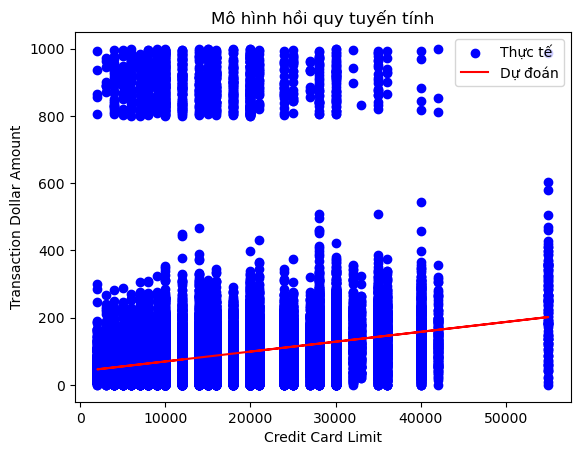

In [244]:
# Vẽ biểu đồ 
plt.scatter(X_test, y_test, color='b', label='Thực tế')
plt.plot(X_test, y_pred, color='r', label='Dự đoán')
plt.xlabel('Credit Card Limit')
plt.ylabel('Transaction Dollar Amount')
plt.legend()
plt.title('Mô hình hồi quy tuyến tính')
plt.show()

In [247]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R^2): {r2}')

Mean Squared Error (MSE): 15112.79076417597
R-squared (R^2): 0.036401221079482404


<a id="5.2"></a>
#### ️🎯 5.2 Mô hình hồi quy tuyến tính giữa 'credit_card_limit' và 'state_encoded' và 'Long_degree' và 'Lat_degree'

In [66]:
# Chọn thuộc tính đầu vào và đầu ra
X = df[['credit_card_limit', 'state_encoded', 'Long_degree', 'Lat_degree']]
y = df['transaction_dollar_amount']

# Tách tập dữ liệu
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Xây dựng mô hình Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)


MAE: 56.00784619941802
MSE: 14595.435363717996
R-squared: 0.038700888744210515


<a id="5.2.1"></a>
##### ️🎯 5.2.1 Xác định chất lượng mô hình hồi quy tuyến tính giữa 'credit_card_limit' và 'state_encoded' và 'Long_degree' và 'Lat_degree'

In [67]:
# Dự đoán trên tập kiểm tra
y_pred = model.predict(X_test)

# Đánh giá mô hình
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# In kết quả
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

MAE: 56.00784619941802
MSE: 14595.435363717996
R-squared: 0.038700888744210515


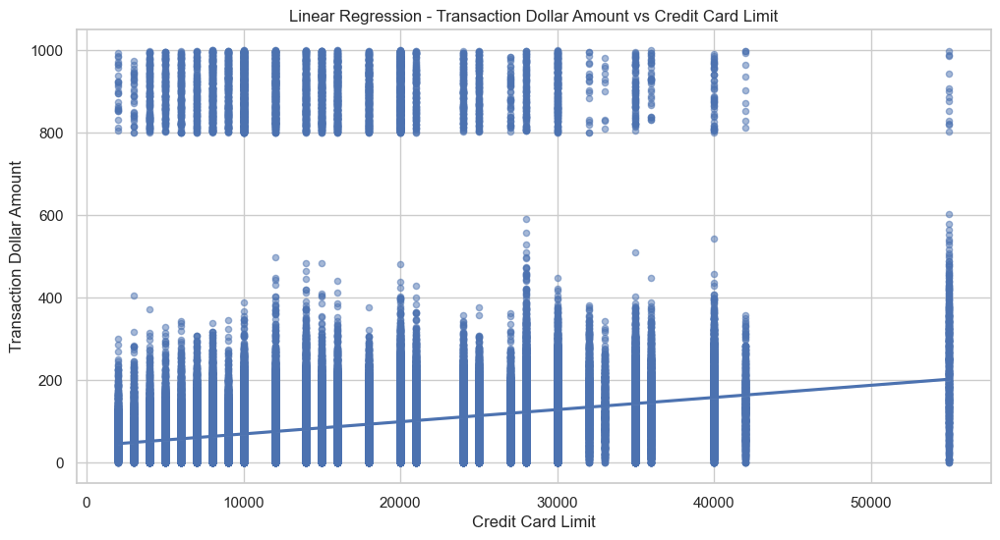

In [69]:
# Vẽ biểu đồ hồi quy tuyến tính
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))

# Sử dụng seaborn để vẽ biểu đồ hồi quy tuyến tính
sns.regplot(x=X['credit_card_limit'], y=y, scatter_kws={'s': 20, 'alpha': 0.5})

# Đặt tên cho trục
plt.title('Linear Regression - Transaction Dollar Amount vs Credit Card Limit')
plt.xlabel('Credit Card Limit')
plt.ylabel('Transaction Dollar Amount')

plt.show()

<a id="5.3"></a>
##### ️🎯 5.3 Chọn các biến giải thích để cho mô hình có chất lượng tốt

Dựa vào các thông số MAE, MSE, R-squared có thể thấy mô hình có: \
X = 'credit_card_limit', 'state_encoded', 'Long_degree', 'Lat_degree' \
y = 'transaction_dollar_amount' \
Có giá trị cao: \
MAE: 56.00784619941802 \
MSE: 14595.435363717996 \
R-squared: 0.038700888744210515

<a id="6"></a>
<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 6. Xây dựng mô hình cây quyết định</strong></h1>
<hr>

<a id="6.1"></a>
#### ️🎯 6.1 Mô hình cây quyết định giữa credit_card_limit và transaction_dollar_amount

In [ ]:
# Chọn biến độc lập và biến mục tiêu
X = data[['credit_card_limit', 'hour']]
y = data['transaction_dollar_amount']

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [250]:

# Xây dựng mô hình cây quyết định
regressor = DecisionTreeRegressor()
regressor.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra
y_pred = regressor.predict(X_test)

<a id="6.1"></a>
##### ️🎯 6.1.1 Xác định chất lượng mô hình cây quyết định giữa credit_card_limit và transaction_dollar_amount

Mean Squared Error (MSE): 14618.97353787733
R-squared (R^2): 0.03715059405713328


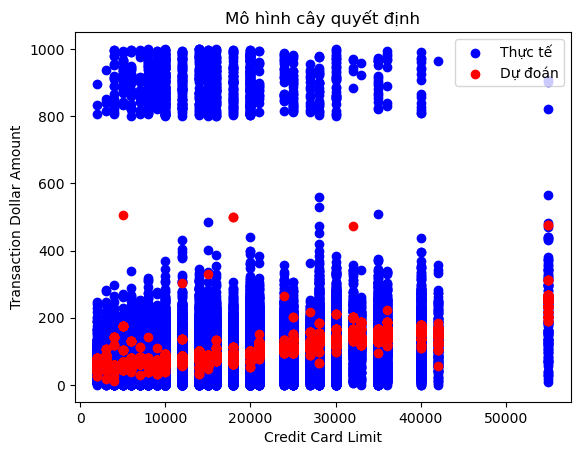

In [251]:
# Đánh giá mô hình
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R^2): {r2}')

# Vẽ biểu đồ
plt.scatter(X_test['credit_card_limit'], y_test, color='b', label='Thực tế')
plt.scatter(X_test['credit_card_limit'], y_pred, color='r', label='Dự đoán')
plt.xlabel('Credit Card Limit')
plt.ylabel('Transaction Dollar Amount')
plt.legend()
plt.title('Mô hình cây quyết định')
plt.show()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.535943 to fit

(process:26336): GLib-GIO-WARNING **: 20:01:46.252: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2023.920.900_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 1 extensions but has no verbs

(process:26336): GLib-GIO-WARNING **: 20:01:46.275: Unexpectedly, UWP app `draw.io.draw.ioDiagrams_22.0.2.0_x64__1zh33159kp73c' (AUMId `draw.io.draw.ioDiagrams_1zh33159kp73c!draw.io.draw.ioDiagrams') supports 2 extensions but has no verbs

(process:26336): GLib-GIO-WARNING **: 20:01:46.282: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2309.16.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs



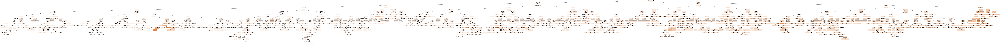

In [253]:
dot_data = export_graphviz(regressor, out_file=None,
                           feature_names=X.columns,
                           filled=True, rounded=True, special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

<a id="6.2"></a>
#### ️🎯 6.2 Mô hình cây quyết định giữa giữa 'credit_card_limit' và 'state_encoded' và 'Long_degree' và 'Lat_degree'

Biến phản hồi : transaction_dollar_amount \
Biến phản hồi được chọn là transaction_dollar_amount \
Vì đang là biến định lượng nên cần thực hiện chuyển đổi thành biến phân loại

In [5]:
# define the bin edges
bin_edges = [-np.inf, 0, 100, 500, 1000, np.inf]
# define the bin labels
bin_labels = ['0', '1-100', '101-500', '501-1000', '>1000']
# create a new column with the binned values
df['transaction_dollar_amount'] = pd.cut(df['transaction_dollar_amount'], bins=bin_edges, labels=bin_labels)
# display the first few rows of the updated dataframe
df.head()

,city,state,zipcode,credit_card_limit,transaction_dollar_amount,Long,Lat,date_only,time_only,hour,day_of_the_week,num_day,month_only,year_only,state_encoded,Long_degree,Lat_degree
credit_card,,,,,,,,,,,,,,,,,
1280981422329509,Dallas,PA,18612,6000,1-100,-75.964527,41.353578,2015/08/05,00:59:19,24,Wednesday,3,8,2015,27,-75,41
1280981422329509,Dallas,PA,18612,6000,1-100,-76.019703,41.311467,2015/10/29,18:23:04,18,Thursday,4,10,2015,27,-76,41
1280981422329509,Dallas,PA,18612,6000,1-100,-76.043031,41.291053,2015/10/25,17:50:48,17,Sunday,0,10,2015,27,-76,41
1280981422329509,Dallas,PA,18612,6000,1-100,-75.944299,41.327282,2015/09/05,17:39:43,17,Saturday,6,9,2015,27,-75,41
1280981422329509,Dallas,PA,18612,6000,1-100,-75.997259,41.352099,2015/09/04,14:12:59,14,Friday,5,9,2015,27,-75,41


In [7]:
df[df['transaction_dollar_amount'] == '1-100']

,city,state,zipcode,credit_card_limit,transaction_dollar_amount,Long,Lat,date_only,time_only,hour,day_of_the_week,num_day,month_only,year_only,state_encoded,Long_degree,Lat_degree
credit_card,,,,,,,,,,,,,,,,,
1280981422329509,Dallas,PA,18612,6000,1-100,-75.964527,41.353578,2015/08/05,00:59:19,24,Wednesday,3,8,2015,27,-75,41
1280981422329509,Dallas,PA,18612,6000,1-100,-76.019703,41.311467,2015/10/29,18:23:04,18,Thursday,4,10,2015,27,-76,41
1280981422329509,Dallas,PA,18612,6000,1-100,-76.043031,41.291053,2015/10/25,17:50:48,17,Sunday,0,10,2015,27,-76,41
1280981422329509,Dallas,PA,18612,6000,1-100,-75.944299,41.327282,2015/09/05,17:39:43,17,Saturday,6,9,2015,27,-75,41
1280981422329509,Dallas,PA,18612,6000,1-100,-75.997259,41.352099,2015/09/04,14:12:59,14,Friday,5,9,2015,27,-75,41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1409322756311484,Houston,PA,15342,15000,1-100,-80.238676,40.228136,2015/09/24,19:18:40,19,Thursday,4,9,2015,27,-80,40
1409322756311484,Houston,PA,15342,15000,1-100,-80.178443,40.247585,2015/08/24,12:36:52,12,Monday,1,8,2015,27,-80,40
1409322756311484,Houston,PA,15342,15000,1-100,-80.211523,40.222771,2015/09/04,19:04:01,19,Friday,5,9,2015,27,-80,40


Phân chia dữ liệu theo tỉ lệ 8:2 \
X gồm 'credit_card_limit','state_encoded','Long_degree','Lat_degree' \
y gồm các giá trị của cột 'transaction_dollar_amount'

In [8]:
X = df[['credit_card_limit','state_encoded','Long_degree','Lat_degree']]
y = df['transaction_dollar_amount']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [9]:
dt = tree.DecisionTreeClassifier(max_depth=2)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2)

Tìm độ sâu tối ưu cho cây quyết định bằng cách duyệt lần lượt độ sâu có trong 'params'

In [10]:
X_train.shape

(235670, 4)

In [11]:
params = {'max_depth':[1, 2, 4, 6, 8, 10, 12, 15, 20, 25, 30, 35, 40, 45, 50]}

In [12]:
cv = GridSearchCV(dt, param_grid=params, scoring= 'accuracy', cv=4,
return_train_score=True)

In [14]:
cv.fit(X_train, y_train)

GridSearchCV(cv=4, estimator=DecisionTreeClassifier(max_depth=2),
             param_grid={'max_depth': [1, 2, 4, 6, 8, 10, 12, 15, 20, 25, 30,
                                       35, 40, 45, 50]},
             return_train_score=True, scoring='accuracy')

In [15]:
cv_results_df = pd.DataFrame(cv.cv_results_)
cv_results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.150642,0.010854,0.039763,0.001580,1,{'max_depth': 1},0.756339,0.755949,0.756132,0.757082,0.756375,0.000431,15,0.756387,0.756518,0.756457,0.756140,0.756375,0.000144
1,0.154210,0.005603,0.040379,0.003102,2,{'max_depth': 2},0.761686,0.766082,0.768064,0.767283,0.765778,0.002466,14,0.762424,0.767437,0.766776,0.767036,0.765918,0.002031
2,0.180633,0.000784,0.044120,0.000916,4,{'max_depth': 4},0.766744,0.765929,0.768030,0.767283,0.766996,0.000767,13,0.767211,0.767482,0.766788,0.767036,0.767129,0.000253
3,0.188974,0.007613,0.039532,0.005512,6,{'max_depth': 6},0.769459,0.769357,0.771696,0.771238,0.770437,0.001042,12,0.770283,0.771046,0.770493,0.770714,0.770634,0.000283
4,0.173403,0.003676,0.039746,0.005270,8,{'max_depth': 8},0.771479,0.771700,0.774547,0.773223,0.772737,0.001242,11,0.773615,0.774447,0.773684,0.773520,0.773816,0.000368
5,0.198724,0.009833,0.043960,0.003174,10,{'max_depth': 10},0.773261,0.772175,0.774751,0.773902,0.773522,0.000940,2,0.776076,0.776636,0.774895,0.775925,0.775883,0.000629
6,0.215059,0.004611,0.046107,0.002710,12,{'max_depth': 12},0.773652,0.772107,0.775837,0.774123,0.773930,0.001330,1,0.777332,0.777722,0.776541,0.777497,0.777273,0.000445
7,0.228880,0.008965,0.046452,0.001214,15,{'max_depth': 15},0.773057,0.772005,0.775447,0.773359,0.773467,0.001249,3,0.778339,0.778843,0.777480,0.778584,0.778311,0.000512
8,0.216516,0.011655,0.047328,0.001606,20,{'max_depth': 20},0.773040,0.771581,0.774836,0.772986,0.773111,0.001155,4,0.779080,0.779539,0.778250,0.779200,0.779017,0.000474
9,0.225494,0.023111,0.044009,0.002142,25,{'max_depth': 25},0.772735,0.771343,0.774802,0.772782,0.772916,0.001233,10,0.779363,0.779816,0.778420,0.779325,0.779231,0.000507


Text(0, 0.5, 'Accuracy')

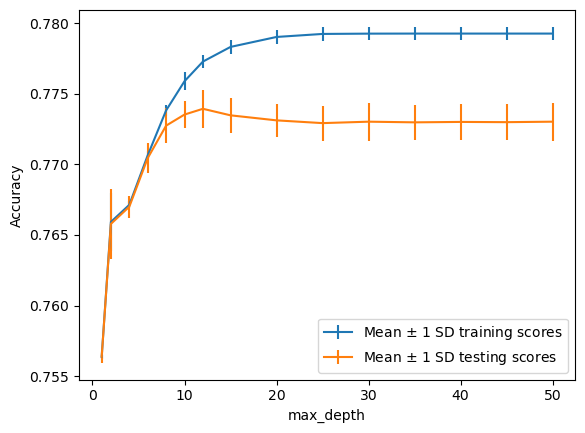

In [16]:
ax = plt.axes()
ax.errorbar(cv_results_df['param_max_depth'],
cv_results_df['mean_train_score'], yerr=cv_results_df['std_train_score'],
label='Mean $\pm$ 1 SD training scores')
ax.errorbar(cv_results_df['param_max_depth'], cv_results_df['mean_test_score'],
yerr=cv_results_df['std_test_score'], label='Mean $\pm$ 1 SD testing scores')
ax.legend()
plt.xlabel('max_depth')
plt.ylabel('Accuracy')

=========> 25 là độ sâu tối ưu nhất vì từ 25 không có sự thay đổi đáng kể về độ chính xác

In [14]:
dt = tree.DecisionTreeClassifier(max_depth=25)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=25)

In [15]:
features_response = list(X.columns) + ['transaction_dollar_amount']
dot_data = tree.export_graphviz(dt, out_file=None, filled=True, rounded=True,
                                feature_names=features_response[:-1],
                                proportion=True, class_names=['0', '0-100', '101-500', '501-1000', '>1000'])

<a id="6.2.1"></a>
##### ️🎯 6.2.1 Xác định chất lượng mô hình cây quyết định giữa giữa 'credit_card_limit' và 'state_encoded' và 'Long_degree' và 'Lat_degree't

In [16]:
y_pred = dt.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy score: {accuracy:.2f}")

f1 = f1_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')

# Output the evaluation metrics
print(f"F1-Score: {f1:.2f}")
print(f"Recall: {recall:.2f}")
print(f"Precision: {precision:.2f}")

Accuracy score: 0.77
F1-Score: 0.74
Recall: 0.77
Precision: 0.73


In [20]:
graph = graphviz.Source(dot_data)
graph


(process:15028): GLib-GIO-WARNING **: 16:54:33.028: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2023.920.900_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 1 extensions but has no verbs

(process:15028): GLib-GIO-WARNING **: 16:54:33.049: Unexpectedly, UWP app `draw.io.draw.ioDiagrams_22.0.2.0_x64__1zh33159kp73c' (AUMId `draw.io.draw.ioDiagrams_1zh33159kp73c!draw.io.draw.ioDiagrams') supports 2 extensions but has no verbs

(process:15028): GLib-GIO-WARNING **: 16:54:33.056: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2309.16.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs


<a id="6.3"></a>
##### ️🎯 6.3 Chọn các biến giải thích cho mô hình có chất lượng tốt nhất

Các biến được chọn là \
X = 'credit_card_limit', 'state_encoded', 'Long_degree', 'Lat_degree' \
y = 'transaction_dollar_amount'. \
Với các giá trị đánh giá: 
* Accuracy score: 0.77 
* F1-Score: 0.74 
* Recall: 0.77 
* Precision: 0.73

1. Accuracy score : 0.77 - Tỉ lệ phần trăm của dự đoán đúng trên tổng số dự đoán. 
2. F1-Score: 0.74 - F1-Score là sự kết hợp giữa Precision và Recall. Giá trị này cũng khá tốt, với sự cân bằng giữa chính xác và bao quát.
3. Recall: 0.77 - Recall là tỷ lệ của các trường hợp dự đoán đúng trên tổng số trường hợp thực tế. Giá trị này cũng khá cao, đặc biệt nếu độ quan trọng của việc bắt những trường hợp dương là quan trọng trong bài toán. 
4. Precision: 0.73 - Precision là tỷ lệ của các trường hợp dự đoán đúng trên tổng số trường hợp dự đoán positive. Nó cũng khá tốt, chỉ ra rằng khi mô hình dự đoán positive, nó đưa ra dự đoán đúng một cách chính xác.

<a id="7"></a>
<h1 style="color:#1B998B;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 7. So sánh các mô hình</strong></h1>
<hr>

<a id="7.1"></a>
##### ️🎯 7.1 So sánh mô hình hồi quy và mô hình cây quyết định

X = 'credit_card_limit', 'state_encoded', 'Long_degree', 'Lat_degree' \
y = 'transaction_dollar_amount'

In [35]:

# Train the linear regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Train the decision tree model
dt_model = DecisionTreeRegressor(max_depth=25)
dt_model.fit(X_train, y_train)

# Evaluate the performance of the models on the testing set
lr_y_pred = lr_model.predict(X_test)
lr_mse = mean_squared_error(y_test, lr_y_pred)
lr_r2 = r2_score(y_test, lr_y_pred)
lr_mae = mean_absolute_error(y_test, lr_y_pred)

dt_y_pred = dt_model.predict(X_test)
dt_mse = mean_squared_error(y_test, dt_y_pred)
dt_r2 = r2_score(y_test, dt_y_pred)
dt_mae = mean_absolute_error(y_test, dt_y_pred)

# Print the evaluation metrics
print("Linear Regression Model:")
print(f"MAE: {lr_mae:.2f}")
print(f"MSE: {lr_mse:.2f}")
print(f"R^2: {lr_r2:.2f}")

print("\nDecision Tree Model:")
print(f"MAE: {dt_mae:.2f}")
print(f"MSE: {dt_mse:.2f}")
print(f"R^2: {dt_r2:.2f}")



Linear Regression Model:
MAE: 56.01
MSE: 14595.44
R^2: 0.04

Decision Tree Model:
MAE: 53.73
MSE: 14569.57
R^2: 0.04


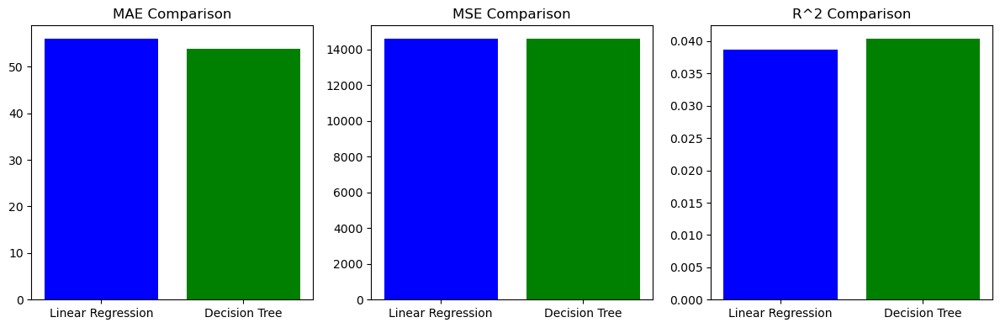

In [39]:
# Tên của các mô hình
model_names = ['Linear Regression', 'Decision Tree']

# Giá trị MAE, MSE, R^2
mae_values = [lr_mae, dt_mae]
mse_values = [lr_mse, dt_mse]
r2_values = [lr_r2, dt_r2]

# Biểu đồ so sánh MAE
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.bar(model_names, mae_values, color=['blue', 'green'])
plt.title('MAE Comparison')

# Biểu đồ so sánh MSE
plt.subplot(1, 3, 2)
plt.bar(model_names, mse_values, color=['blue', 'green'])
plt.title('MSE Comparison')

# Biểu đồ so sánh R^2
plt.subplot(1, 3, 3)
plt.bar(model_names, r2_values, color=['blue', 'green'])
plt.title('R^2 Comparison')

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()

<a id="7.2"></a>
##### ️🎯 7.2 Kết luận

Với các thông số R^2 và MSE, ta thấy mô hình cây quyết định và hồi quy tuyến tính có chỉ số R^2 bằng nhau, có sự khác biệt nhỏ MSE,MAE giữa 2 mô hình
Nếu MSE,MAE càng nhỏ sẽ cho ra mô hình tốt hơn nên mô hình cây quyết định sẽ phù hợp cho trường hợp này.